# Main results and analyses

This notebook contains the code corresponding to the main analyses of the PARs and physiological ages obtained from various predictive models (included as files). Some analyses included in this notebook are:
- Correlation between physiological age and chronological age
- Distribution of PARs by chronological age
- Correlation between PAR measurements from different models and setups
- Linearly rescaled PAR results
- Trimmed PAR results
- Miscellaneous controls and checks

Results are included for all follow-up and baseline waves of the SardiNIA study and the inCHIANTI study and for two select models: the random forest classifier (RFC) and elastic net regression (ElNet).

In [1]:
import numpy as np
import matplotlib.pyplot as pl
from scipy.stats import pearsonr
import pandas as pd
import glob as gb
import csv

colors = ['#324851', '#86AC41', '#34675C', '#7DA3A1']

## Functions for visualizing physiological ages and PARs from results files

In [18]:
def plotResults (data_file, save_name, bound='none', rescale='none', save='yes', title=None, dpi=800):
    '''
    Function for generating plots of:
        - physiological age vs chronological age
        - PAR vs chronological age
        - Histogram of PAR against chronological age
    
    'data_file' is the path to the output results file for runModel.py
    Can specify if 'bound' for trimmed data according to bound=[min,max]
    Can specify if 'rescale' = 'linear' for linearly rescaled PAR values
    '''
    data = np.genfromtxt('./Results/'+data_file+'.tsv', delimiter='\t')
    colors = ['#324851', '#86AC41', '#34675C', '#7DA3A1']
    sorted_act_ages = data[:,1]
    sorted_pred_ages = data[:,2]  
    
    if rescale == 'linear':
        fit = np.polyfit(sorted_act_ages,sorted_pred_ages,1)
        fit_fn = np.poly1d(fit)
        slope, intercept = np.polyfit(sorted_act_ages, fit_fn(sorted_act_ages),1)
        sorted_pred_ages = linearRescale(sorted_pred_ages, slope, intercept)
    
    age_ratio = np.array(sorted_pred_ages)/np.array(sorted_act_ages)

    if bound == 'none':
        pl.figure(figsize=(5,5))
        fit = np.polyfit(sorted_act_ages,sorted_pred_ages,1)
        fit_fn = np.poly1d(fit)
        slope, intercept = np.polyfit(sorted_act_ages, fit_fn(sorted_act_ages),1)
        pl.plot(sorted_act_ages, sorted_pred_ages, marker='o', linestyle='', markerfacecolor=colors[1], alpha=0.1)
        #pl.plot(sorted_act_ages, fit_fn(sorted_act_ages), '--k', alpha=0.1)
        pl.ylim([5,85])
        pl.xlim([5,85])
        pearson, p = pearsonr(sorted_act_ages, sorted_pred_ages)
        mae = np.mean(np.abs(np.array(sorted_act_ages)-np.array(sorted_pred_ages)))
        pl.annotate('$R^2$ = '+str("%.3f" %(pearson*pearson)), xy=(0.65, 0.325), xycoords='axes fraction', fontsize=11)
        pl.annotate('MAE = '+str("%.3f" %(mae)), xy=(0.65, 0.25), xycoords='axes fraction', fontsize=11)
        pl.annotate('Slope = '+str("%.2f" %slope), xy=(0.65, 0.175), xycoords='axes fraction', fontsize=11)
        pl.annotate('y-intercept = '+str("%.2f" %intercept), xy=(0.65, 0.1), xycoords='axes fraction', fontsize=11)
        if rescale == 'none':
            pl.ylabel('Physiological Age', fontsize=14)
        else:
            pl.ylabel('Physiological Age', fontsize=14)
        pl.xlabel('Chronological Age', fontsize=14)
        pl.tick_params(axis='both', which='major', labelsize=12)
        pl.tick_params(axis='both', which='minor', labelsize=12)
        if title is not None:
            pl.title(title, fontsize=14)
        pl.plot([5,85], [5,85], 'k')
        pl.tight_layout()
        pl.savefig('./Figures/Models/'+save_name+'_actVSpred.png', format='png', dpi=dpi)
        pl.show()

        pl.figure(figsize=(5,5))
        age_ratio = np.array(sorted_pred_ages)/np.array(sorted_act_ages)
        fit = np.polyfit(sorted_act_ages,age_ratio,1)
        fit_fn = np.poly1d(fit)
        slope, intercept = np.polyfit(sorted_act_ages, fit_fn(sorted_act_ages),1)
        pl.plot(sorted_act_ages, age_ratio, marker='o', linestyle='', markerfacecolor=colors[1], alpha=0.1)
        #pl.plot(sorted_act_ages, fit_fn(sorted_act_ages), '--k', alpha=0.1)
        pearson, p = pearsonr(sorted_act_ages, age_ratio)
        pl.ylim([-1,3])
        pl.xlim([10,85])
        pl.annotate('$R^2$ = '+str("%.3f" %(pearson*pearson)), xy=(0.65, 0.25), xycoords='axes fraction', fontsize=11)
        pl.annotate('Slope = '+str("%.2f" %slope), xy=(0.65, 0.175), xycoords='axes fraction', fontsize=11)
        pl.annotate('y-intercept = '+str("%.2f" %intercept), xy=(0.65, 0.1), xycoords='axes fraction', fontsize=11)
        pl.xlabel('Chronological Age', fontsize=14)
        pl.ylabel('Physiological aging rate (PAR)', fontsize=14)
        pl.tick_params(axis='both', which='major', labelsize=12)
        pl.tick_params(axis='both', which='minor', labelsize=12)
        pl.plot([10,85], [1,1], 'k')
        if title is not None:
            pl.title(title, fontsize=14)
        pl.tight_layout()
        if save == 'yes':
            pl.savefig('./Figures/Models/'+save_name+'_neg.png', format='png', dpi=dpi)
        pl.show()
    
    else: # BOUND CONDITIONS
        lower_bound = bound[0]
        upper_bound = bound[1]
        middle_idxs = np.where((sorted_act_ages >= lower_bound) & (sorted_act_ages <= upper_bound))
        edge_idxs = np.where((sorted_act_ages < lower_bound) | (sorted_act_ages > upper_bound))
        middle_act_ages = sorted_act_ages[middle_idxs]
        middle_pred_ages = sorted_pred_ages[middle_idxs]
        edge_act_ages = sorted_act_ages[edge_idxs]
        edge_pred_ages = sorted_pred_ages[edge_idxs]

        pl.figure(figsize=(5,5))
        fit = np.polyfit(middle_act_ages,middle_pred_ages,1)
        fit_fn = np.poly1d(fit)
        slope, intercept = np.polyfit(middle_act_ages, fit_fn(middle_act_ages),1)
        pl.plot(middle_act_ages, middle_pred_ages, marker='o', linestyle='', markerfacecolor=colors[1], alpha=0.1)
        #pl.plot(middle_act_ages, fit_fn(middle_act_ages), '--k', alpha=0.1)
        pl.plot(edge_act_ages, edge_pred_ages, marker='o', linestyle='', markerfacecolor=colors[3], alpha=0.1, label='edge ages')
        pl.ylim([5,85])
        pl.xlim([5,85])
        pearson, p = pearsonr(middle_act_ages, middle_pred_ages)
        mae = np.mean(np.abs(np.array(middle_act_ages)-np.array(middle_pred_ages)))
        pl.annotate('Bound = ' + '['+str(bound[0])+' ,'+str(bound[1])+']', xy=(0.65, 0.4), xycoords='axes fraction', fontsize=11)
        pl.annotate('$R^2$ = '+str("%.3f" %(pearson*pearson)), xy=(0.65, 0.325), xycoords='axes fraction', fontsize=11)
        pl.annotate('MAE = '+str("%.3f" %(mae)), xy=(0.65, 0.25), xycoords='axes fraction', fontsize=11)
        pl.annotate('Slope = '+str("%.2f" %slope), xy=(0.65, 0.175), xycoords='axes fraction', fontsize=11)
        pl.annotate('y-intercept = '+str("%.2f" %intercept), xy=(0.65, 0.1), xycoords='axes fraction', fontsize=11)
        pl.xlabel('Chronological Age', fontsize=14)
        if rescale == 'none':
            pl.ylabel('Physiological Age', fontsize=14)
        else:
            pl.ylabel('Physiological Age', fontsize=14)
        pl.tick_params(axis='both', which='major', labelsize=12)
        pl.tick_params(axis='both', which='minor', labelsize=12)
        pl.plot([5,85], [5,85], 'k')
        #pl.legend(bbox_to_anchor=(1.04,1), loc="upper left")
        pl.legend(loc="upper left")
        pl.tight_layout()
        if save == 'yes':
            pl.savefig('./Figures/Models/'+save_name+'_actVSpred_bound.png', format='png', dpi=dpi)
        pl.show()

        pl.figure(figsize=(5,5))
        middle_age_ratio = np.array(middle_pred_ages)/np.array(middle_act_ages)
        edge_age_ratio = np.array(edge_pred_ages)/np.array(edge_act_ages)
        fit = np.polyfit(middle_act_ages,middle_age_ratio,1)
        fit_fn = np.poly1d(fit)
        slope, intercept = np.polyfit(middle_act_ages, fit_fn(middle_act_ages),1)
        pl.plot(middle_act_ages, middle_age_ratio, marker='o', linestyle='', markerfacecolor=colors[1], alpha=0.1)
        #pl.plot(middle_act_ages, fit_fn(middle_act_ages), '--k', alpha=0.1)
        pl.plot(edge_act_ages, edge_age_ratio, marker='o', linestyle='', markerfacecolor=colors[3], alpha=0.1, label='edge ages')
        pl.ylim([-1,3])
        pl.xlim([10,85])
        pearson, p = pearsonr(middle_act_ages, middle_age_ratio)
        pl.annotate('Bound = ' + '['+str(bound[0])+' ,'+str(bound[1])+']', xy=(0.65, 0.325), xycoords='axes fraction', fontsize=11)
        pl.annotate('$R^2$ = '+str("%.3f" %(pearson*pearson)), xy=(0.65, 0.25), xycoords='axes fraction', fontsize=11)
        pl.annotate('Slope = '+str("%.2f" %slope), xy=(0.65, 0.175), xycoords='axes fraction', fontsize=11)
        pl.annotate('y-intercept = '+str("%.2f" %intercept), xy=(0.65, 0.1), xycoords='axes fraction', fontsize=11)
        pl.xlabel('Chronological Age', fontsize=14)
        pl.ylabel('Physiological aging rate (PAR)', fontsize=14)
        pl.tick_params(axis='both', which='major', labelsize=12)
        pl.tick_params(axis='both', which='minor', labelsize=12)
        pl.plot([10,85], [1,1], 'k')
        #pl.legend(bbox_to_anchor=(1.04,1), loc="upper left")
        pl.tight_layout()
        pl.legend(loc="upper right")
        pl.tight_layout()
        if save == 'yes':
            pl.savefig('./Figures/Models/'+save_name+'_neg_bound.png', format='png', dpi=dpi)
        pl.show()
    
    # Plotting distribution of rates histogram
    neg_group = []
    pos_group = []
    for i, ratio in enumerate(age_ratio):
        if ratio-1 < 0:
            neg_group.append(sorted_act_ages[i])
        else:
            pos_group.append(sorted_act_ages[i])
            
    # Weights (to make proportions)
    (nums, bins, ps) = pl.hist(sorted_act_ages, bins=np.arange(np.min(sorted_act_ages), np.max(sorted_act_ages), 5))
    weights = np.divide(1.00, np.array(nums))
    (neg_nums, bins, ps) = pl.hist(neg_group, bins=np.arange(np.min(sorted_act_ages), np.max(sorted_act_ages), 5))
    neg_weights = neg_nums * weights
    (pos_nums, bins, ps) = pl.hist(pos_group, bins=np.arange(np.min(sorted_act_ages), np.max(sorted_act_ages), 5))
    pos_weights = pos_nums * weights
    age_range = (np.arange(np.min(sorted_act_ages)-5, np.max(sorted_act_ages), 5) + np.arange(np.min(sorted_act_ages), np.max(sorted_act_ages)+5, 5))/2
    age_range = age_range[1:]
    age_range = age_range[:-1]
    pl.close()

    # Plots
    new_plot = pl.figure(2)
    ax = pl.subplot(111)
    ax.hist(age_range, weights=neg_weights, bins=np.arange(np.min(sorted_act_ages), np.max(sorted_act_ages), 5), color='g', alpha=0.2, label='rate < 1')
    ax.hist(age_range, weights=pos_weights, bins=np.arange(np.min(sorted_act_ages), np.max(sorted_act_ages), 5), color='r', alpha=0.2, label='rate > 1')
    pl.ylim([0,1])
    pl.title(save_name + ' Rate Distribution')
    pl.xlabel('Actual Age')
    pl.ylabel('Number of Individuals')
    pl.legend(loc=1)
    pl.tight_layout()
    if save == 'yes':
        pl.savefig('./Figures/Models/'+save_name+'_dist.png', format='png', dpi=dpi)
    pl.show(new_plot)

In [19]:
def plotComparison (data_file_x, data_file_y, save_name, bound='none', rescale='none', 
                    save='yes', show='yes', x_label=None, y_label=None, dpi=800, include_r=False):
    '''
    Function for comparing results across two results files
    Can specify if 'bound' for trimmed data according to bound=[min,max]
    Can specify if 'rescale' = 'linear' for linearly rescaled PAR values
    Will save plots of physiological age X vs physiological age Y and of PAR X vs PAR Y
    '''
    colors = ['#324851', '#86AC41', '#34675C', '#7DA3A1']
    try:
        data_x = np.genfromtxt('./Results/'+data_file_x+'.tsv', delimiter='\t')
    except:
        data_x = np.genfromtxt('./Results/'+data_file_x+'.csv', delimiter=',')
    try:
        data_y = np.genfromtxt('./Results/'+data_file_y+'.tsv', delimiter='\t')
    except:
        data_y = np.genfromtxt('./Results/'+data_file_y+'.csv', delimiter=',')

    x_ids = data_x[:,0]
    order_x = np.argsort(x_ids)
    y_ids = data_y[:,0]
    order_y = np.argsort(y_ids)

    # actual ages
    act_x = data_x[:,1]
    act_y = data_y[:,1]
    
    # predicted ages
    pred_x = data_x[:,2]
    pred_y  = data_y[:,2]
    
    if rescale == 'linear':
        fit_x = np.polyfit(act_x,pred_x,1)
        fit_fn_x = np.poly1d(fit_x)
        slope_x, intercept_x = np.polyfit(act_x, fit_fn_x(act_x),1)
        pred_x = linearRescale(pred_x, slope_x, intercept_x)
        
        fit_y = np.polyfit(act_y,pred_y,1)
        fit_fn_y = np.poly1d(fit_y)
        slope_y, intercept_y = np.polyfit(act_y, fit_fn_y(act_y),1)
        pred_y = linearRescale(pred_y, slope_y, intercept_y)
    
    elif rescale == 'linear_x':
        fit_x = np.polyfit(act_x,pred_x,1)
        fit_fn_x = np.poly1d(fit_x)
        slope_x, intercept_x = np.polyfit(act_x, fit_fn_x(act_x),1)
        pred_x = linearRescale(pred_x, slope_x, intercept_x)
        
    elif rescale == 'linear_y':
        fit_y = np.polyfit(act_y,pred_y,1)
        fit_fn_y = np.poly1d(fit_y)
        slope_y, intercept_y = np.polyfit(act_y, fit_fn_y(act_y),1)
        pred_y = linearRescale(pred_y, slope_y, intercept_y)
        
    
    # rates
    rates_x = np.array(pred_x)/np.array(act_x)
    rates_y  = np.array(pred_y)/np.array(act_y)

    x_rates = []
    y_rates = []
    x_act = []
    y_act = []
    x_pred = []
    y_pred = []

    # Find identities in both sets and order them correspondingly
    for identity in y_ids:
        if identity in x_ids:
            xidx = np.where(x_ids==identity)
            yidx = np.where(y_ids==identity)
            if np.isnan(rates_x[xidx]) or np.isnan(rates_y[yidx]) or np.isnan(pred_x[xidx]) or np.isnan(pred_y[yidx]) or np.isnan(act_y[yidx]) or np.isnan(act_x[xidx]):
                continue
            else:
                x_rates.append(float(rates_x[xidx]))
                y_rates.append(float(rates_y[yidx]))
                x_pred.append(float(pred_x[xidx]))
                y_pred.append(float(pred_y[yidx]))
                x_act.append(float(act_x[xidx]))
                y_act.append(float(act_y[yidx]))

    x_rates = np.array(x_rates)
    y_rates = np.array(y_rates)
    x_act = np.array(x_act)
    y_act = np.array(y_act)
    x_pred = np.array(x_pred)
    y_pred = np.array(y_pred)
                
    if bound == 'none':
        pl.figure(figsize=(5,5))
        pl.title('Physiological Aging Rate', fontsize=14)
        fit = np.polyfit(x_rates,y_rates,1)
        fit_fn = np.poly1d(fit)
        slope, intercept = np.polyfit(x_rates, fit_fn(x_rates),1)
        pl.plot(x_rates, y_rates, marker='o', linestyle='', markerfacecolor=colors[3], alpha=0.05)
        #pl.plot(x_rates, fit_fn(x_rates), '--k', alpha=0.1)
        pearson, p = pearsonr(x_rates,y_rates)
        if include_r is True:
            pl.annotate('$R^2$ = '+str("%.3f" %(pearson*pearson)), xy=(0.62, 0.275), xycoords='axes fraction', fontsize=11)
            pl.annotate('$r$ = '+str("%.3f" %(pearson)), xy=(0.62, 0.2), xycoords='axes fraction', fontsize=11)
            pl.annotate('Slope = '+str("%.2f" %slope), xy=(0.62, 0.125), xycoords='axes fraction', fontsize=11)
            pl.annotate('y-intercept = '+str("%.2f" %intercept), xy=(0.62, 0.05), xycoords='axes fraction', fontsize=11)
        else:
            pl.annotate('$R^2$ = '+str("%.3f" %(pearson*pearson)), xy=(0.65, 0.25), xycoords='axes fraction', fontsize=11)
            pl.annotate('Slope = '+str("%.2f" %slope), xy=(0.65, 0.175), xycoords='axes fraction', fontsize=11)
            pl.annotate('y-intercept = '+str("%.2f" %intercept), xy=(0.65, 0.1), xycoords='axes fraction', fontsize=11)
        pl.plot([-0.05,2.05], [-0.05,2.05], 'k')
        pl.xlim(-0.05,2.05)
        pl.ylim(-0.05,2.05)
        if x_label is None:
            pl.xlabel(data_file_x)
        else:
            pl.xlabel(x_label, fontsize=14)
            pl.tick_params(axis='both', which='major', labelsize=12)
            pl.tick_params(axis='both', which='minor', labelsize=12)
        if y_label is None:
            pl.ylabel(data_file_y)
        else:
            pl.ylabel(y_label, fontsize=14)
            pl.tick_params(axis='both', which='major', labelsize=12)
            pl.tick_params(axis='both', which='minor', labelsize=12)
        if save == 'yes':
            pl.tight_layout()
            pl.savefig('./Figures/Comparisons/'+save_name+'_rates.png', format='png', dpi=dpi)
        if show == 'yes':
            pl.show()

        pl.figure(figsize=(5,5))
        if rescale == 'none':
            pl.title('Physiological Age', fontsize=14)
        else:
            pl.title('Physiological Age', fontsize=14)
        fit = np.polyfit(x_pred,y_pred,1)
        fit_fn = np.poly1d(fit)
        slope, intercept = np.polyfit(x_pred, fit_fn(x_pred),1)
        pl.plot(x_pred, y_pred, marker='o', linestyle='', markerfacecolor=colors[3], alpha=0.05)
        #pl.plot(x_pred, fit_fn(x_pred), '--k', alpha=0.1)
        pearson, p = pearsonr(x_pred,y_pred)
        pl.annotate('$R^2$ = '+str("%.3f" %(pearson*pearson)), xy=(0.65, 0.25), xycoords='axes fraction', fontsize=11)
        pl.annotate('Slope = '+str("%.2f" %slope), xy=(0.65, 0.175), xycoords='axes fraction', fontsize=11)
        pl.annotate('y-intercept = '+str("%.2f" %intercept), xy=(0.65, 0.1), xycoords='axes fraction', fontsize=11)    
        pl.plot([0,95], [0,95], 'k')
        if x_label is None:
            pl.xlabel(data_file_x)
        else:
            pl.xlabel(x_label, fontsize=14)
            pl.tick_params(axis='both', which='major', labelsize=12)
            pl.tick_params(axis='both', which='minor', labelsize=12)
        if y_label is None:
            pl.ylabel(data_file_y)
        else:
            pl.ylabel(y_label, fontsize=14)
            pl.tick_params(axis='both', which='major', labelsize=12)
            pl.tick_params(axis='both', which='minor', labelsize=12)
        if save == 'yes':
            pl.tight_layout()
            pl.savefig('./Figures/Comparisons/'+save_name+'_pred.png', format='png', dpi=dpi)
        if show == 'yes':
            pl.show()
        
    else: # BOUND CONDITION
        lower_bound = bound[0]
        upper_bound = bound[1]
        # actual ages should be the same now
        middle_idxs = np.where((x_act >= lower_bound) & (x_act <= upper_bound))
        edge_idxs = np.where((x_act < lower_bound) | (x_act > upper_bound))
        middle_x_pred = x_pred[middle_idxs]
        middle_y_pred = y_pred[middle_idxs]
        edge_x_pred = x_pred[edge_idxs]
        edge_y_pred = y_pred[edge_idxs]
        middle_x_rates = x_rates[middle_idxs]
        middle_y_rates = y_rates[middle_idxs]
        edge_x_rates = x_rates[edge_idxs]
        edge_y_rates = y_rates[edge_idxs]
        
        
        pl.figure(figsize=(5,5))
        fit = np.polyfit(middle_x_rates,middle_y_rates,1)
        fit_fn = np.poly1d(fit)
        slope, intercept = np.polyfit(middle_x_rates, fit_fn(middle_x_rates),1)
        pl.plot(middle_x_rates, middle_y_rates, marker='o', markerfacecolor=colors[3], linestyle='', alpha=0.05)
        #pl.plot(middle_x_rates, fit_fn(middle_x_rates), '--k', alpha=0.1)
        pl.plot(middle_x_rates, middle_y_rates, marker='o', markerfacecolor=colors[0], linestyle='', alpha=0.05)
        pearson, p = pearsonr(middle_x_rates,middle_y_rates)
        pl.annotate('Bound = ' + '['+str(bound[0])+' ,'+str(bound[1])+']', xy=(0.65, 0.325), xycoords='axes fraction', fontsize=11)
        pl.annotate('$R^2$ = '+str("%.3f" %(pearson*pearson)), xy=(0.65, 0.25), xycoords='axes fraction', fontsize=11)
        pl.annotate('Slope = '+str("%.2f" %slope), xy=(0.65, 0.175), xycoords='axes fraction', fontsize=11)
        pl.annotate('y-intercept = '+str("%.2f" %intercept), xy=(0.65, 0.1), xycoords='axes fraction', fontsize=11)
        pl.plot([-0.05,2.05], [-0.05,2.05], 'k')
        pl.xlim(-0.05,2.05)
        pl.ylim(-0.05,2.05)
        pl.title('Physiological Aging Rate', fontsize=14)
        if x_label is None:
            pl.xlabel(data_file_x)
        else:
            pl.xlabel(x_label, fontsize=14)
            pl.tick_params(axis='both', which='major', labelsize=12)
            pl.tick_params(axis='both', which='minor', labelsize=12)
        if y_label is None:
            pl.ylabel(data_file_y)
        else:
            pl.ylabel(y_label, fontsize=14)
            pl.tick_params(axis='both', which='major', labelsize=12)
            pl.tick_params(axis='both', which='minor', labelsize=12)
        #pl.legend(bbox_to_anchor=(1.04,1), loc="upper left")
        #pl.legend(loc="upper left")
        if save == 'yes':
            pl.tight_layout()
            pl.savefig('./Figures/Comparisons/'+save_name+'_rates_bound.png', format='png', dpi=dpi)
        if show == 'yes':
            pl.show()

        pl.figure(figsize=(5,5))
        fit = np.polyfit(middle_x_pred,middle_y_pred,1)
        fit_fn = np.poly1d(fit)
        slope, intercept = np.polyfit(middle_x_pred, fit_fn(middle_x_pred),1)
        pl.plot(middle_x_pred, middle_y_pred, marker='o', markerfacecolor=colors[3], linestyle='', alpha=0.05)
        #pl.plot(middle_x_pred, fit_fn(middle_x_pred), '--k', alpha=0.1)
        pl.plot(edge_x_pred, edge_y_pred, marker='o', markerfacecolor=colors[0], linestyle='', alpha=0.05)
        pearson, p = pearsonr(middle_x_pred,middle_y_pred)
        pl.annotate('Bound = ' + '['+str(bound[0])+' ,'+str(bound[1])+']', xy=(0.65, 0.325), xycoords='axes fraction', fontsize=11)
        pl.annotate('$R^2$ = '+str("%.3f" %(pearson*pearson)), xy=(0.65, 0.25), xycoords='axes fraction', fontsize=11)
        pl.annotate('Slope = '+str("%.2f" %slope), xy=(0.65, 0.175), xycoords='axes fraction', fontsize=11)
        pl.annotate('y-intercept = '+str("%.2f" %intercept), xy=(0.65, 0.1), xycoords='axes fraction', fontsize=11)    
        pl.plot([0,95], [0,95], 'k')
        pl.title('Physiological Age', fontsize=14)
        if x_label is None:
            pl.xlabel(data_file_x)
        else:
            pl.xlabel(x_label, fontsize=14)
            pl.tick_params(axis='both', which='major', labelsize=12)
            pl.tick_params(axis='both', which='minor', labelsize=12)
        if y_label is None:
            pl.ylabel(data_file_y)
        else:
            pl.ylabel(y_label, fontsize=14)
            pl.tick_params(axis='both', which='major', labelsize=12)
            pl.tick_params(axis='both', which='minor', labelsize=12)
        #pl.legend(bbox_to_anchor=(1.04,1), loc="upper left")
        pl.legend(loc="upper left")
        if save == 'yes':
            pl.tight_layout()
            pl.savefig('./Figures/Comparisons/'+save_name+'_pred_bound.png', format='png', dpi=dpi)
        if show == 'yes':
            pl.show()

In [20]:
def linearRescale (predicted_ages, slope, intercept):
    '''
    Linearly rescales predicted ages so that predicted vs chronological ages will have slope ~1.0
    See supplementary sections for analytical details
    '''
    # slope and intercept calculated from y: pred, x: actual
    rescaled_predicted_ages = np.subtract(predicted_ages, intercept)
    rescaled_predicted_ages = np.divide(rescaled_predicted_ages, slope)
    return (rescaled_predicted_ages)

In [21]:
def averageFiles (dir_path, save_name):
    '''
    Averages PAR measurements from across all TSV result files in the 'dir_path'. TSV files must all be in the output
    format of runModel.py. This function is used to average PARs for all individuals across all baseline and follow-up
    waves of the studies.
    '''
    predicted_dict = {}
    chron_dict = {}
    rate_dict = {}
    
    for count, file in enumerate(gb.glob(dir_path+'*.tsv'), 1):
        results_data = np.loadtxt(file, delimiter='\t')
        ids = results_data[:,0]
        chrons = results_data[:,1]
        preds = results_data[:,2]
        rates = results_data[:,3]
        
        for idx, participant in enumerate(ids):
            if participant not in predicted_dict:
                predicted_dict[participant] = []
                chron_dict[participant] = []
                rate_dict[participant] = []
            predicted_dict[participant].append(preds[idx])
            chron_dict[participant].append(chrons[idx])
            rate_dict[participant].append(rates[idx])
    
    predicted_ages = []
    chronological_ages = []
    aging_rates = []
    participant_ids = []
    
    for key, value in predicted_dict.items():
        participant_ids.append(int(key))
        predicted_ages.append(np.mean(predicted_dict[key]))
        chronological_ages.append(np.mean(chron_dict[key]))
        aging_rates.append(np.mean(rate_dict[key]))
        
    order = np.argsort(participant_ids)
    predicted_ages = np.array(predicted_ages)[order]
    chronological_ages = np.array(chronological_ages)[order]
    aging_rates = np.array(aging_rates)[order]
    participant_ids = np.array(participant_ids)[order]

    save_file = np.column_stack((participant_ids, chronological_ages, predicted_ages, aging_rates))

    np.savetxt('./Results/'+save_name+'.tsv', save_file, fmt='%.3f', delimiter='\t')

In [22]:
def saveRatesNEW (file_dir, save_name, bound='no', rescale='no'):
    '''
    See 'averageFiles'
    If specified by bound and rescale:
        Will optionally perform trimming of PARs or linear rescaling of physiological ages before averaging
    '''
    predicted_dict = {}
    chron_dict = {}
    rate_dict = {}
    paa_dict = {}
    rescaled_rate_dict = {}
    rescaled_paa_dict = {}
    
    for count, file in enumerate(gb.glob(file_dir+'*.tsv'), 1):
        results_data = np.loadtxt(file, delimiter='\t')
        ids = results_data[:,0]
        chrons = results_data[:,1]
        preds = results_data[:,2]
        rates = results_data[:,3]
        paas = preds-chrons
        
        results_data = np.column_stack((results_data, paas))
        
        # rescale rates if needed
        if rescale == 'linear' and bound != 'no':
            lower_bound = bound[0]
            upper_bound = bound[1]
            middle_idxs = np.where((chrons >= lower_bound) & (chrons <= upper_bound))
            results_data = np.vstack(results_data[middle_idxs,:])
            chrons = results_data[:,1]
            preds = results_data[:,2]
            ids = results_data[:,0]
            rates = results_data[:,3]
            paas = results_data[:,4]
            fit = np.polyfit(chrons,preds,1)
            fit_fn = np.poly1d(fit)
            slope, intercept = np.polyfit(chrons, fit_fn(chrons),1)
            rescaled_pred_ages = linearRescale(preds, slope, intercept)
            rescaled_rates = np.array(rescaled_pred_ages)/chrons
            rescaled_paas = np.array(rescaled_pred_ages)-chrons
        
        elif rescale == 'linear':
            fit = np.polyfit(chrons,preds,1)
            fit_fn = np.poly1d(fit)
            slope, intercept = np.polyfit(chrons, fit_fn(chrons),1)
            rescaled_pred_ages = linearRescale(preds, slope, intercept)
            rescaled_rates = np.array(rescaled_pred_ages)/chrons
            rescaled_paas = np.array(rescaled_pred_ages)-chrons
        
        for idx, participant in enumerate(ids):
            if participant not in predicted_dict:
                predicted_dict[participant] = []
                chron_dict[participant] = []
                rate_dict[participant] = []
                paa_dict[participant] = []
                rescaled_rate_dict[participant] = []
                rescaled_paa_dict[participant] = []
            predicted_dict[participant].append(preds[idx])
            chron_dict[participant].append(chrons[idx])
            rate_dict[participant].append(rates[idx])
            paa_dict[participant].append(paas[idx])
            rescaled_rate_dict[participant].append(rescaled_rates[idx])
            rescaled_paa_dict[participant].append(rescaled_paas[idx])
    
    predicted_ages = []
    chronological_ages = []
    aging_rates = []
    physaccels = []
    rescaled_aging_rates = []
    rescaled_physaccels = []
    participant_ids = []
    
    for key, value in predicted_dict.items():
        participant_ids.append(int(key))
        predicted_ages.append(np.mean(predicted_dict[key]))
        chronological_ages.append(np.mean(chron_dict[key]))
        physaccels.append(np.mean(paa_dict[key]))
        aging_rates.append(np.mean(rate_dict[key]))
        rescaled_physaccels.append(np.mean(rescaled_paa_dict[key]))
        rescaled_aging_rates.append(np.mean(rescaled_rate_dict[key]))
        
    order = np.argsort(participant_ids)
    predicted_ages = np.array(predicted_ages)[order]
    chronological_ages = np.array(chronological_ages)[order]
    aging_rates = np.array(aging_rates)[order]
    physaccels = np.array(physaccels)[order]
    rescaled_aging_rates = np.array(rescaled_aging_rates)[order]
    rescaled_physaccels = np.array(rescaled_physaccels)[order]
    participant_ids = np.array(participant_ids)[order]

    data = np.column_stack((participant_ids, chronological_ages, predicted_ages, aging_rates, rescaled_aging_rates, physaccels, rescaled_physaccels))
    
    np.savetxt('./Results/Rates/'+save_name+'.tsv', data, fmt='%.3f', delimiter='\t')

In [23]:
def saveRatesOLD (file_dir, save_name, bound='no', rescale='no'):
    '''
    [Deprecated] -- performs averaging before rescaling
    '''
    averageFiles(file_dir, 'Rates/'+save_name)
    data = np.genfromtxt('./Results/Rates/'+save_name+'.tsv', delimiter='\t')
    
    sorted_act_ages = data[:,1]
    sorted_pred_ages = data[:,2]
    ids = data[:,0]

    if rescale == 'linear' and bound is not 'no':
        lower_bound = bound[0]
        upper_bound = bound[1]
        middle_idxs = np.where((sorted_act_ages >= lower_bound) & (sorted_act_ages <= upper_bound))
        data = np.vstack(data[middle_idxs,:])
        middle_act_ages = data[:,1]
        middle_pred_ages = data[:,2]
        middle_ids = data[:,0]
        fit = np.polyfit(middle_act_ages,middle_pred_ages,1)
        fit_fn = np.poly1d(fit)
        slope, intercept = np.polyfit(middle_act_ages, fit_fn(middle_act_ages),1)
        rescaled_pred_ages = linearRescale(middle_pred_ages, slope, intercept)
        rescaled_rates = np.array(rescaled_pred_ages)/middle_act_ages
        data = np.column_stack((data, rescaled_rates))
        
    elif rescale == 'linear':
        fit = np.polyfit(sorted_act_ages,sorted_pred_ages,1)
        fit_fn = np.poly1d(fit)
        slope, intercept = np.polyfit(sorted_act_ages, fit_fn(sorted_act_ages),1)
        rescaled_pred_ages = linearRescale(sorted_pred_ages, slope, intercept)
        rescaled_rates = np.array(rescaled_pred_ages)/sorted_act_ages
        data = np.column_stack((data, rescaled_rates))
    
    np.savetxt('./Results/Rates/'+save_name+'.tsv', data, fmt='%.3f', delimiter='\t')

# Function for averaging data from multiple split run files

In [24]:
def averageFiles (dir_path, save_name):
    
    predicted_dict = {}
    chron_dict = {}
    rate_dict = {}
    
    for count, file in enumerate(gb.glob(dir_path+'*.tsv'), 1):
        results_data = np.loadtxt(file, delimiter='\t')
        ids = results_data[:,0]
        chrons = results_data[:,1]
        preds = results_data[:,2]
        rates = results_data[:,3]
        
        for idx, participant in enumerate(ids):
            if participant not in predicted_dict:
                predicted_dict[participant] = []
                chron_dict[participant] = []
                rate_dict[participant] = []
            predicted_dict[participant].append(preds[idx])
            chron_dict[participant].append(chrons[idx])
            rate_dict[participant].append(rates[idx])
    
    predicted_ages = []
    chronological_ages = []
    aging_rates = []
    participant_ids = []
    
    for key, value in predicted_dict.items():
        participant_ids.append(int(key))
        predicted_ages.append(np.mean(predicted_dict[key]))
        chronological_ages.append(np.mean(chron_dict[key]))
        aging_rates.append(np.mean(rate_dict[key]))
        
    order = np.argsort(participant_ids)
    predicted_ages = np.array(predicted_ages)[order]
    chronological_ages = np.array(chronological_ages)[order]
    aging_rates = np.array(aging_rates)[order]
    participant_ids = np.array(participant_ids)[order]

    save_file = np.column_stack((participant_ids, chronological_ages, predicted_ages, aging_rates))

    np.savetxt('./Results/'+save_name+'.tsv', save_file, fmt='%.3f', delimiter='\t')

In [25]:
# 1000 W1
averageFiles ('./Results/RFC_sardinia/cluster_runs/', 'RFC_Sard_w1_1000splits')
# 10k all waves
averageFiles ('./Results/RFC_sardinia/cluster_runs10k/Wave1/', 'RFC_Sard_w1_10k')
averageFiles ('./Results/RFC_sardinia/cluster_runs10k/Wave2/', 'RFC_Sard_w2_10k')
averageFiles ('./Results/RFC_sardinia/cluster_runs10k/Wave3/', 'RFC_Sard_w3_10k')

In [15]:
def plotSpread (data_file, save_name, age, spread):
    data = np.genfromtxt('./Results/'+data_file+'.tsv', delimiter='\t')

    act_ages = data[:,1]
    pred_ages = data[:,2]
    
    lower_bound = age-spread
    upper_bound = age+spread
    range_idxs = np.where((act_ages >= lower_bound) & (act_ages <= upper_bound))
    
    range_preds = pred_ages[range_idxs]
    
    pl.figure()
    pl.hist(range_preds, bins=9, fc=(0,1,0,0.1))
    pl.xlabel('Physiological Age')
    pl.ylabel('Number of individuals of ' + str(age) + ' years of age')
    pl.axvline(x=age, linewidth=2.0, label='Chronological Age')
    #pl.title(save_name + ': Predicted Age Distribution')
    pl.legend(loc="best")
    pl.savefig('./Figures/'+save_name+'_pred.png', dpi=800)
    pl.show()
    
    
    # Rescaling
    
    fit = np.polyfit(act_ages,pred_ages,1)
    fit_fn = np.poly1d(fit)
    slope, intercept = np.polyfit(act_ages, fit_fn(act_ages),1)
    rescaled_pred_ages = linearRescale(pred_ages, slope, intercept)
    
    range_rescaled_preds = rescaled_pred_ages[range_idxs]
    
    pl.figure()
    pl.hist(range_rescaled_preds, bins=9, fc=(0,1,0,0.1))
    pl.xlabel('Rescaled physiological age')
    pl.ylabel('Number of individuals of ' + str(age) + ' years of age')
    pl.axvline(x=age, linewidth=2.0, label='Chronological Age')
    #pl.title(save_name + ': Physiological Age Distribution')
    pl.legend(loc="best")
    pl.savefig('./Figures/'+save_name+'_phys.png', dpi=800)
    pl.show()

# FINAL SARDINIA RESULTS (10k splits)

### Full-Trait (W1)

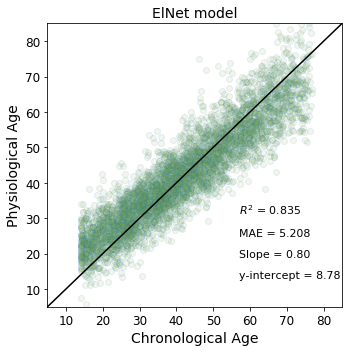

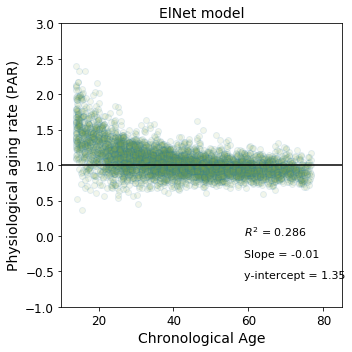

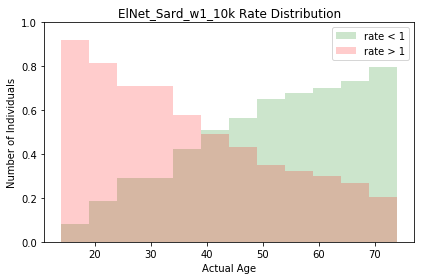

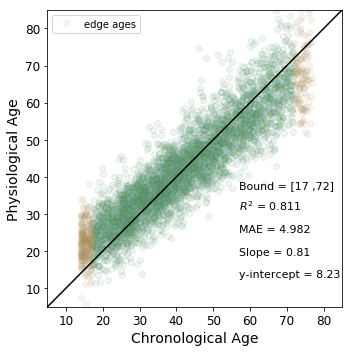

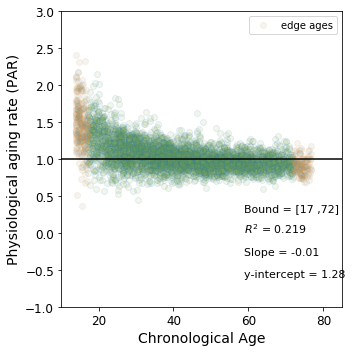

...

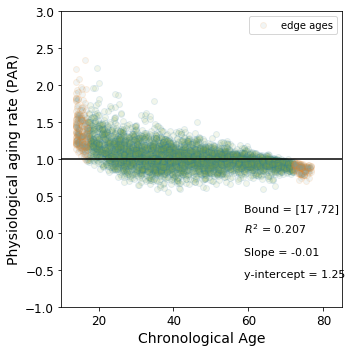

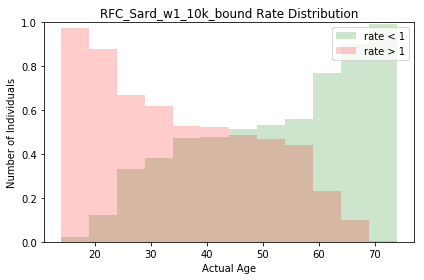

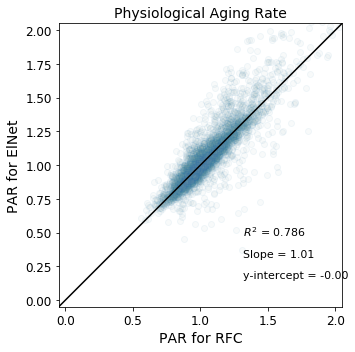

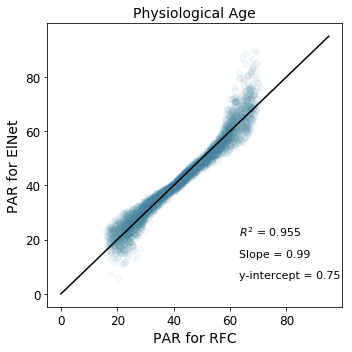

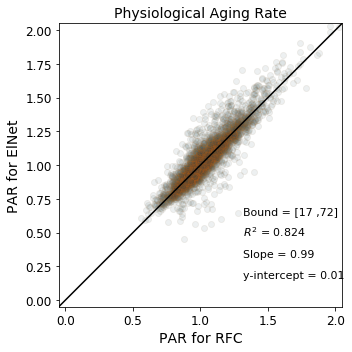

No handles with labels found to put in legend.


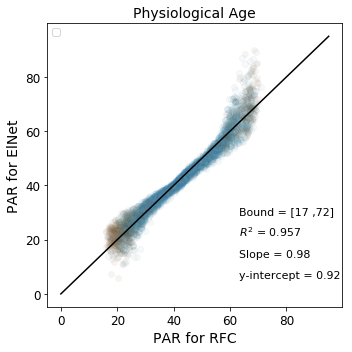

In [27]:
plotResults('SardiNIA/wave1_normal_en', 'ElNet_Sard_w1_10k', title='ElNet model', rescale='none')
plotResults('SardiNIA/wave1_normal_en', 'ElNet_Sard_w1_10k_bound', bound=[17,72], rescale='none')
plotResults('SardiNIA/wave1_normal_rf', 'RFC_Sard_w1_10k', title='RFC model', rescale='none')
plotResults('SardiNIA/wave1_normal_rf', 'RFC_Sard_w1_10k_bound', bound=[17,72], rescale='none')
plotComparison('SardiNIA/wave1_normal_rf', 'SardiNIA/wave1_normal_en', 'W1_rfc_en_10k', x_label='PAR for RFC',y_label='PAR for ElNet', rescale='none')
plotComparison('SardiNIA/wave1_normal_rf', 'SardiNIA/wave1_normal_en', 'W1_rfc_en_10k_bound', x_label='PAR for RFC',y_label='PAR for ElNet',bound=[17,72], rescale='none')

### Linearly rescaled physiological age

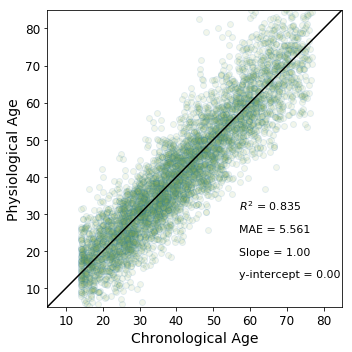

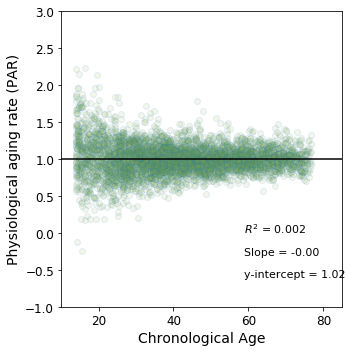

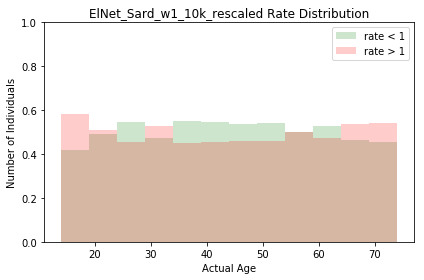

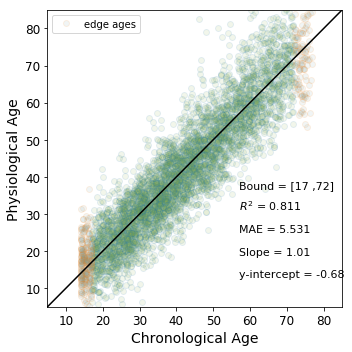

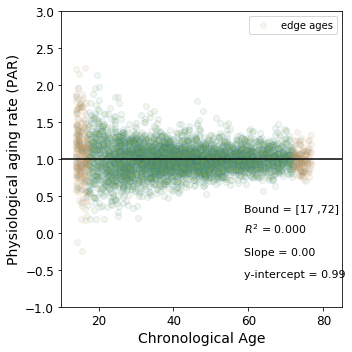

...

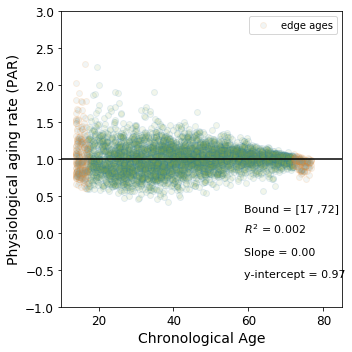

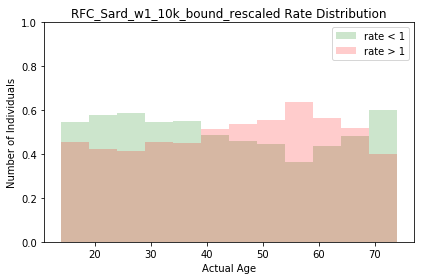

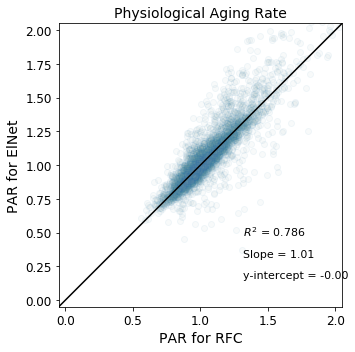

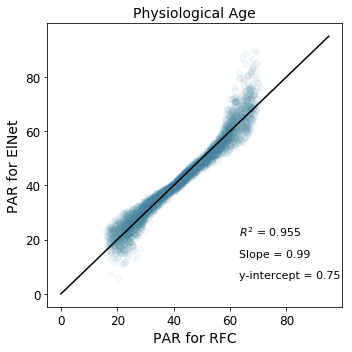

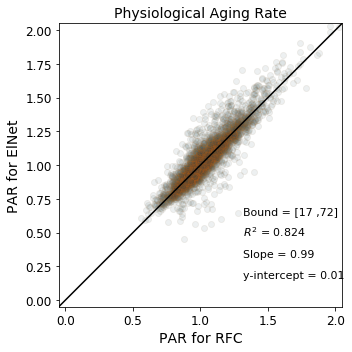

No handles with labels found to put in legend.


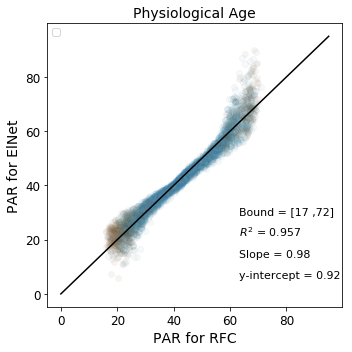

In [28]:
plotResults('SardiNIA/wave1_normal_en', 'ElNet_Sard_w1_10k_rescaled', rescale='linear')
plotResults('SardiNIA/wave1_normal_en', 'ElNet_Sard_w1_10k_bound_rescaled', bound=[17,72], rescale='linear')
plotResults('SardiNIA/wave1_normal_rf', 'RFC_Sard_w1_10k_rescaled', rescale='linear')
plotResults('SardiNIA/wave1_normal_rf', 'RFC_Sard_w1_10k_bound_rescaled', bound=[17,72], rescale='linear')
plotComparison('SardiNIA/wave1_normal_rf', 'SardiNIA/wave1_normal_en', 'W1_rfc_en_10k_rescaled', x_label='PAR for RFC',y_label='PAR for ElNet', rescale='none')
plotComparison('SardiNIA/wave1_normal_rf', 'SardiNIA/wave1_normal_en', 'W1_rfc_en_10k_bound_rescaled', x_label='PAR for RFC',y_label='PAR for ElNet',bound=[17,72], rescale='none')

### Full-Trait (W2)

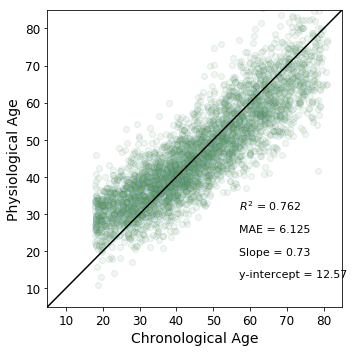

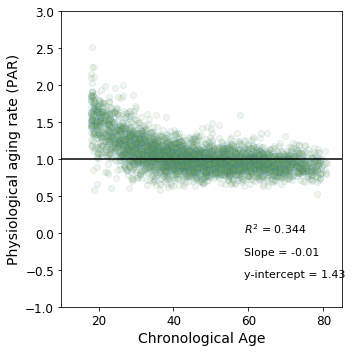

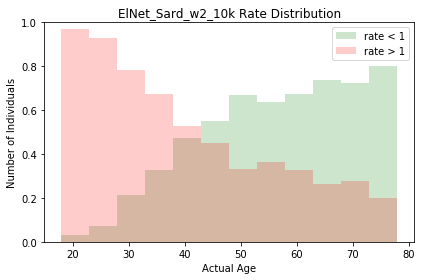

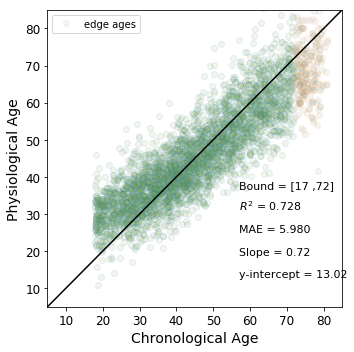

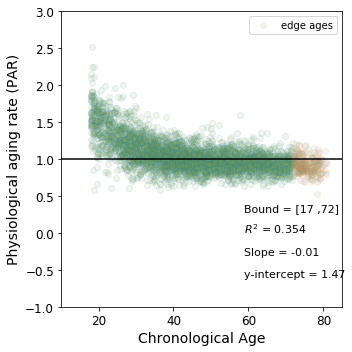

...

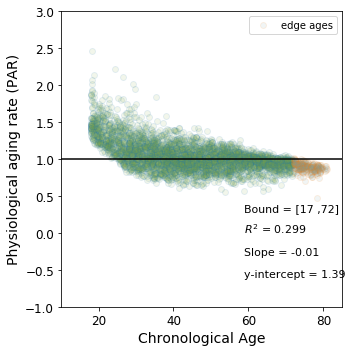

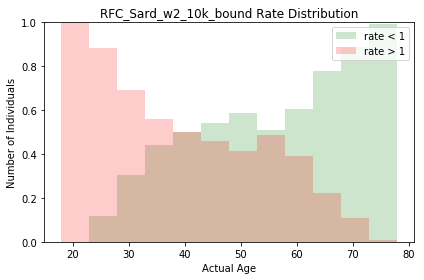

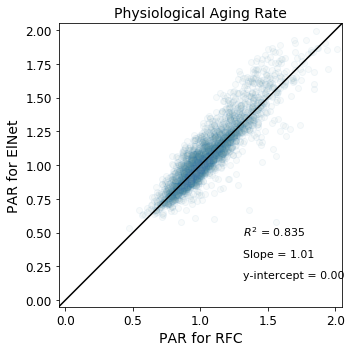

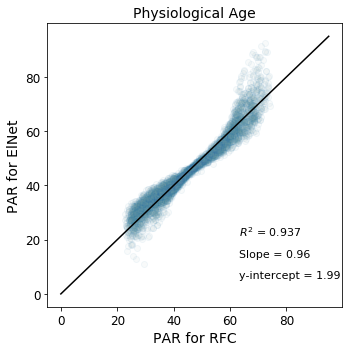

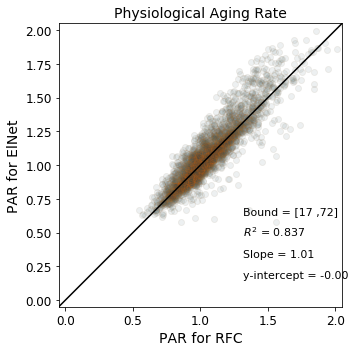

No handles with labels found to put in legend.


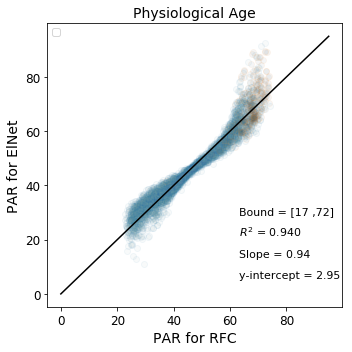

In [29]:
plotResults('SardiNIA/wave2_normal_en', 'ElNet_Sard_w2_10k', rescale='none')
plotResults('SardiNIA/wave2_normal_en', 'ElNet_Sard_w2_10k_bound', bound=[17,72], rescale='none')
plotResults('SardiNIA/wave2_normal_rf', 'RFC_Sard_w2_10k', rescale='none')
plotResults('SardiNIA/wave2_normal_rf', 'RFC_Sard_w2_10k_bound', bound=[17,72], rescale='none')
plotComparison('SardiNIA/wave2_normal_rf', 'SardiNIA/wave2_normal_en', 'W2_rfc_en_10k', x_label='PAR for RFC',y_label='PAR for ElNet', rescale='none')
plotComparison('SardiNIA/wave2_normal_rf', 'SardiNIA/wave2_normal_en', 'W2_rfc_en_10k_bound', x_label='PAR for RFC',y_label='PAR for ElNet',bound=[17,72], rescale='none')

### Full-Trait (W3)

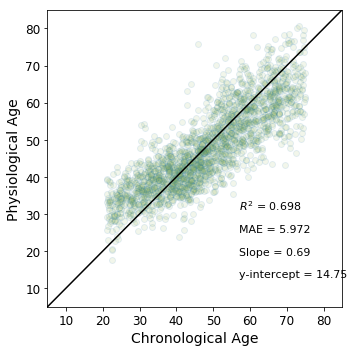

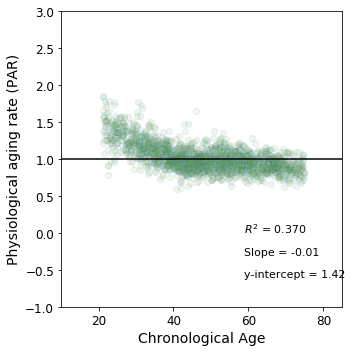

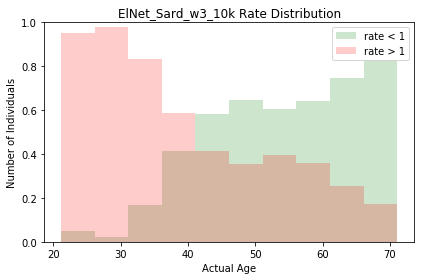

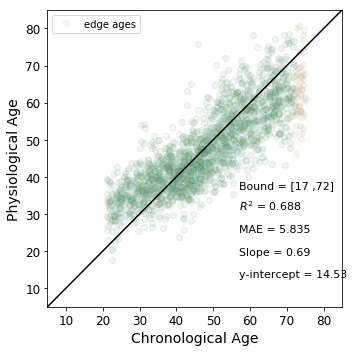

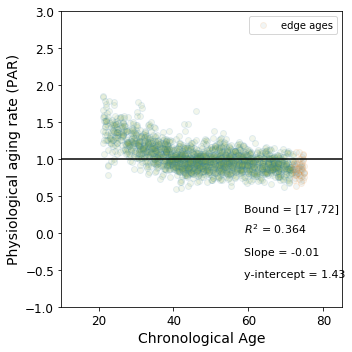

...

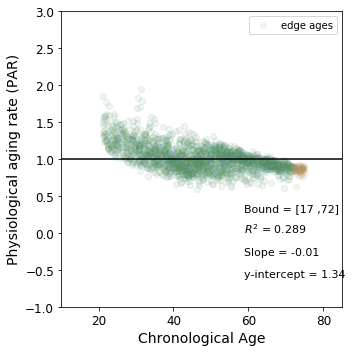

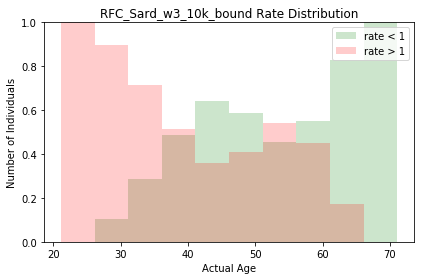

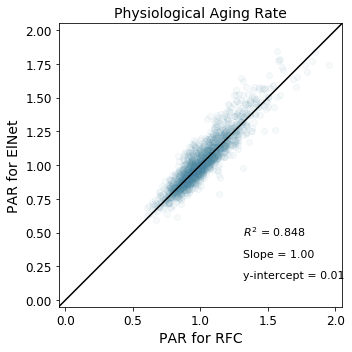

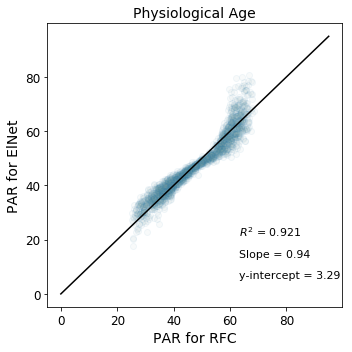

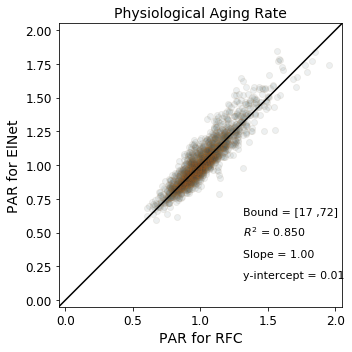

No handles with labels found to put in legend.


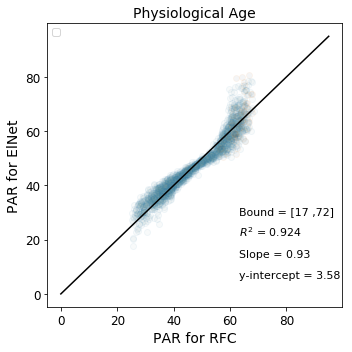

In [30]:
plotResults('SardiNIA/wave3_normal_en', 'ElNet_Sard_w3_10k', rescale='none')
plotResults('SardiNIA/wave3_normal_en', 'ElNet_Sard_w3_10k_bound', bound=[17,72], rescale='none')
plotResults('SardiNIA/wave3_normal_rf', 'RFC_Sard_w3_10k', rescale='none')
plotResults('SardiNIA/wave3_normal_rf', 'RFC_Sard_w3_10k_bound', bound=[17,72], rescale='none')
plotComparison('SardiNIA/wave3_normal_rf', 'SardiNIA/wave3_normal_en', 'W3_rfc_en_10k', x_label='PAR for RFC',y_label='PAR for ElNet', rescale='none')
plotComparison('SardiNIA/wave3_normal_rf', 'SardiNIA/wave3_normal_en', 'W3_rfc_en_10k_bound', x_label='PAR for RFC',y_label='PAR for ElNet',bound=[17,72], rescale='none')

### Full-Trait (W4)

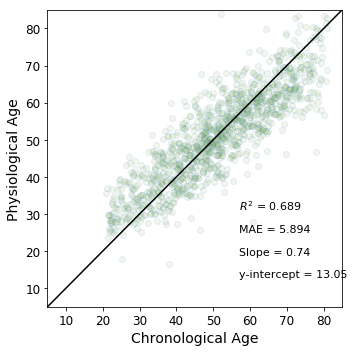

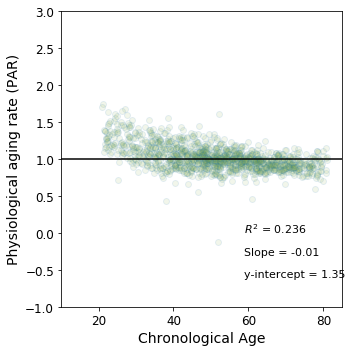

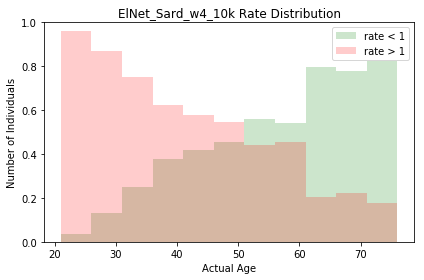

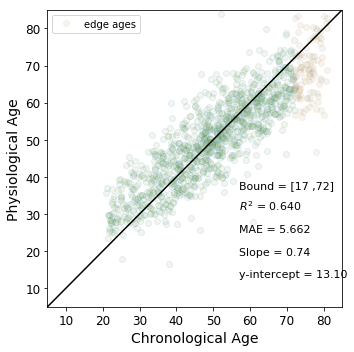

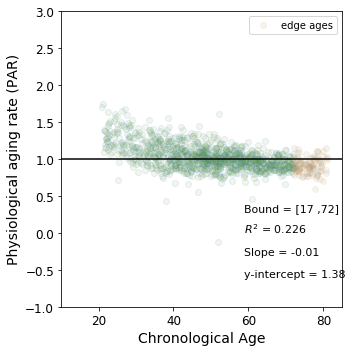

...

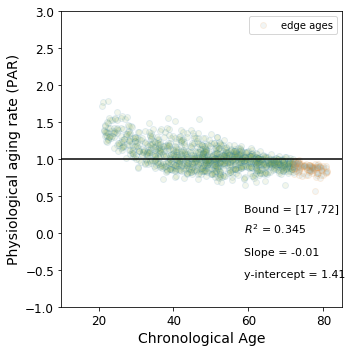

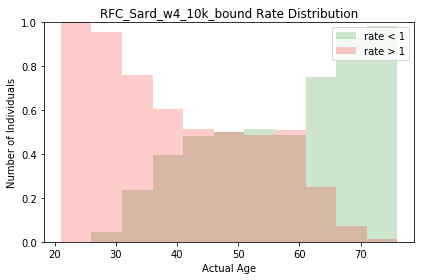

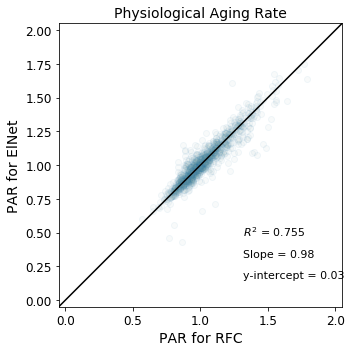

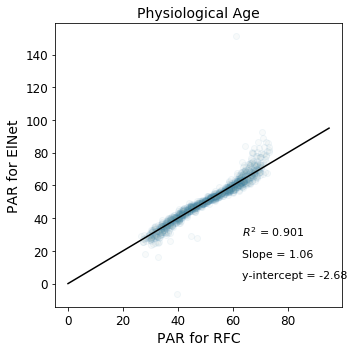

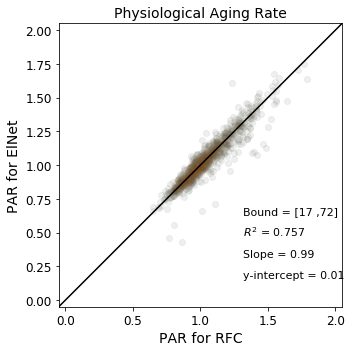

No handles with labels found to put in legend.


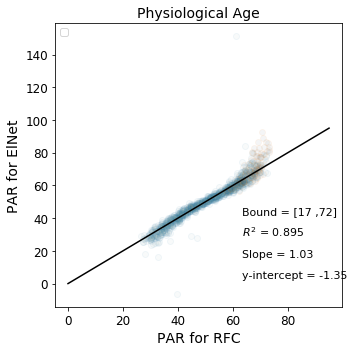

In [31]:
plotResults('SardiNIA/wave4_normal_en', 'ElNet_Sard_w4_10k', rescale='none')
plotResults('SardiNIA/wave4_normal_en', 'ElNet_Sard_w4_10k_bound', bound=[17,72], rescale='none')
plotResults('SardiNIA/wave4_normal_rf', 'RFC_Sard_w4_10k', rescale='none')
plotResults('SardiNIA/wave4_normal_rf', 'RFC_Sard_w4_10k_bound', bound=[17,72], rescale='none')
plotComparison('SardiNIA/wave4_normal_rf', 'SardiNIA/wave4_normal_en', 'W4_rfc_en_10k', x_label='PAR for RFC',y_label='PAR for ElNet', rescale='none')
plotComparison('SardiNIA/wave4_normal_rf', 'SardiNIA/wave4_normal_en', 'W4_rfc_en_10k_bound', x_label='PAR for RFC',y_label='PAR for ElNet',bound=[17,72], rescale='none')

## 65-trait SardiNIA model

### 65 Common Clinical (W1)

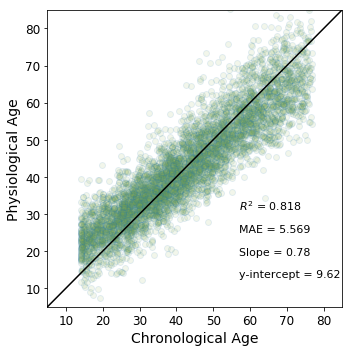

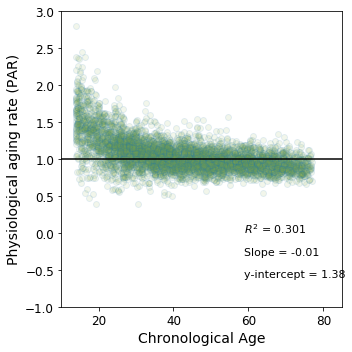

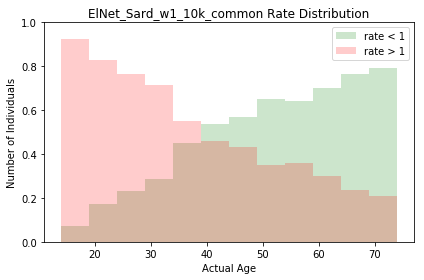

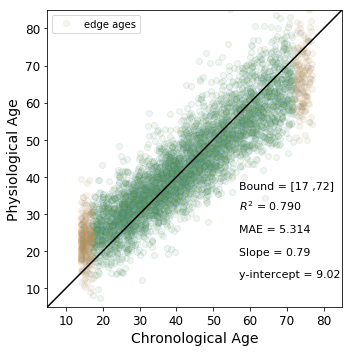

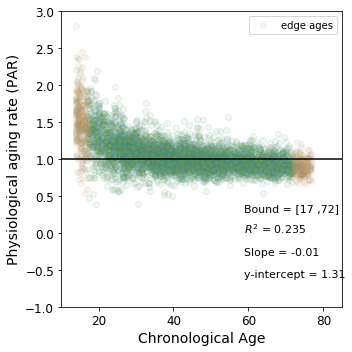

...

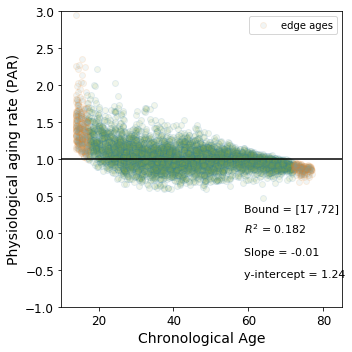

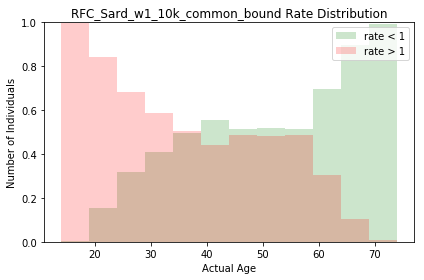

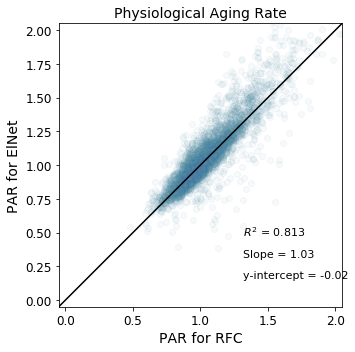

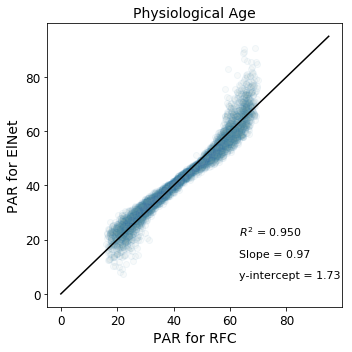

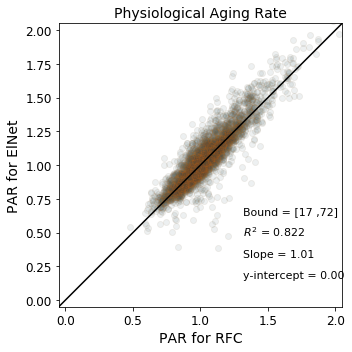

No handles with labels found to put in legend.


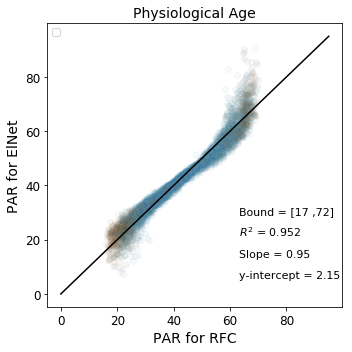

In [32]:
plotResults('SardiNIA/wave1_common_en', 'ElNet_Sard_w1_10k_common', rescale='none')
plotResults('SardiNIA/wave1_common_en', 'ElNet_Sard_w1_10k_common_bound', bound=[17,72], rescale='none')
plotResults('SardiNIA/wave1_common_rf', 'RFC_Sard_w1_10k_common', rescale='none')
plotResults('SardiNIA/wave1_common_rf', 'RFC_Sard_w1_10k_common_bound', bound=[17,72], rescale='none')
plotComparison('SardiNIA/wave1_common_rf', 'SardiNIA/wave1_common_en', 'W1_rfc_ElNet_10k_common',x_label='PAR for RFC',y_label='PAR for ElNet', rescale='none')
plotComparison('SardiNIA/wave1_common_rf', 'SardiNIA/wave1_common_en', 'W1_rfc_ElNet_10k_common_bound', bound=[17,72],x_label='PAR for RFC',y_label='PAR for ElNet', rescale='none')

### Linearly rescaled physiological age

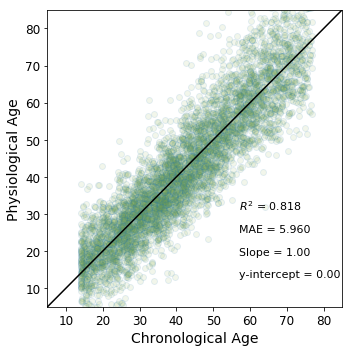

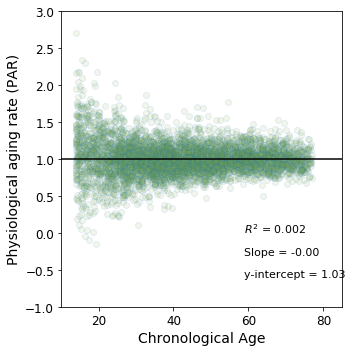

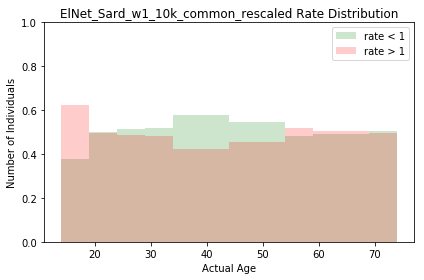

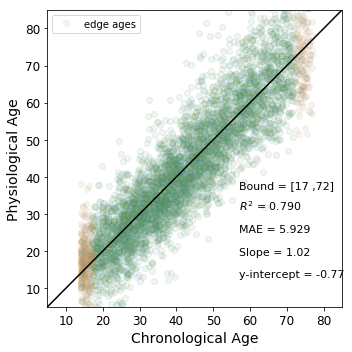

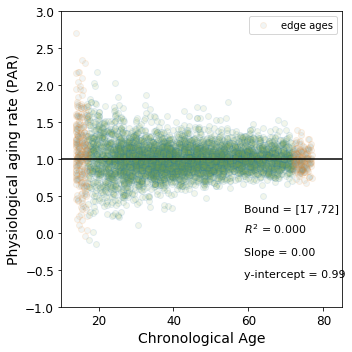

...

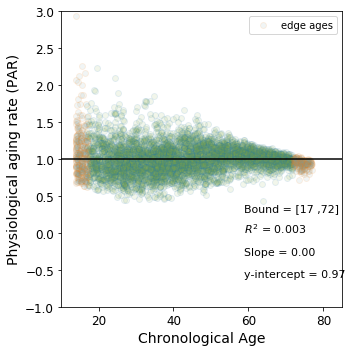

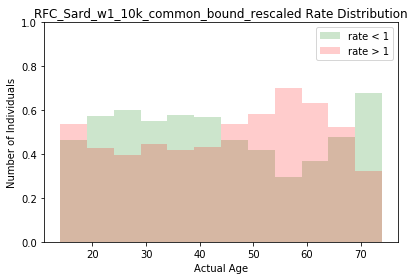

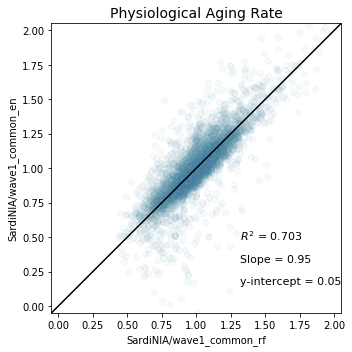

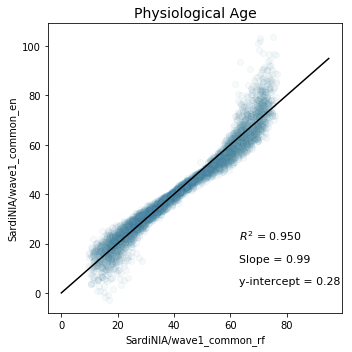

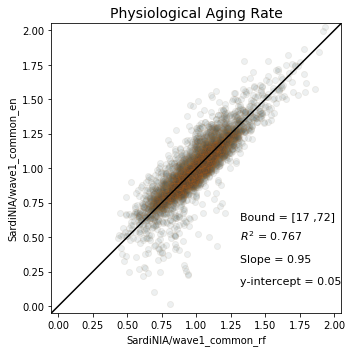

No handles with labels found to put in legend.


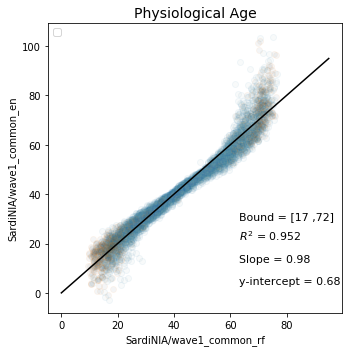

In [33]:
plotResults('SardiNIA/wave1_common_en', 'ElNet_Sard_w1_10k_common_rescaled', rescale='linear')
plotResults('SardiNIA/wave1_common_en', 'ElNet_Sard_w1_10k_common_bound_rescaled', bound=[17,72], rescale='linear')
plotResults('SardiNIA/wave1_common_rf', 'RFC_Sard_w1_10k_common_rescaled', rescale='linear')
plotResults('SardiNIA/wave1_common_rf', 'RFC_Sard_w1_10k_common_bound_rescaled', bound=[17,72], rescale='linear')
plotComparison('SardiNIA/wave1_common_rf', 'SardiNIA/wave1_common_en', 'W1_rfc_ElNet_10k_common_rescaled', rescale='linear')
plotComparison('SardiNIA/wave1_common_rf', 'SardiNIA/wave1_common_en', 'W1_rfc_ElNet_10k_common_bound_rescaled', bound=[17,72], rescale='linear')

### 65 Common Clinical (W2)

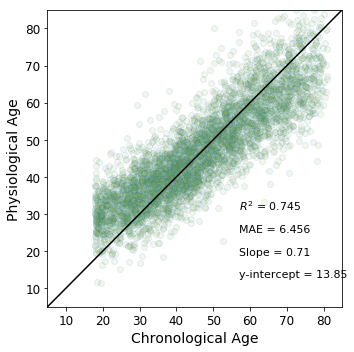

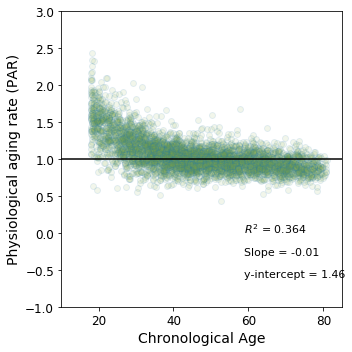

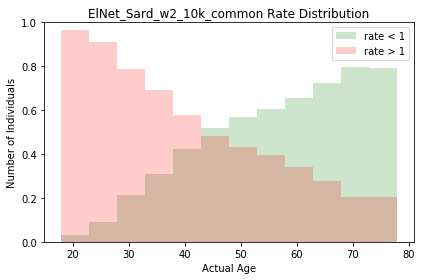

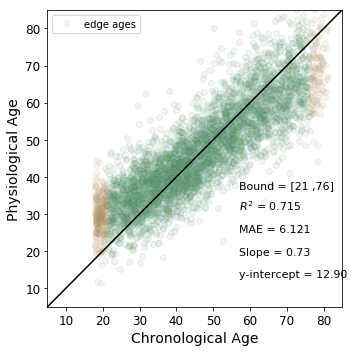

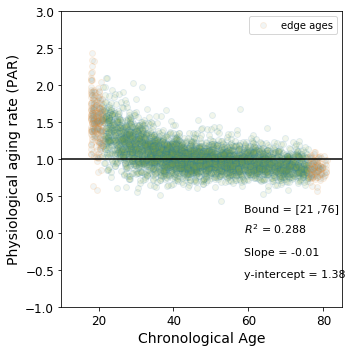

...

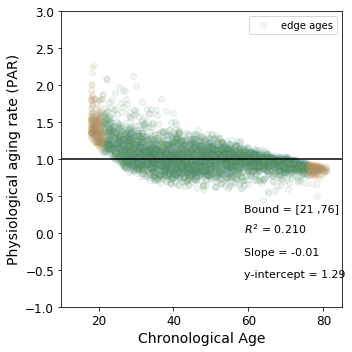

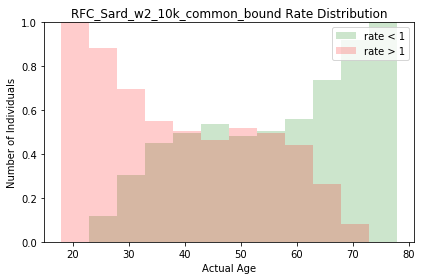

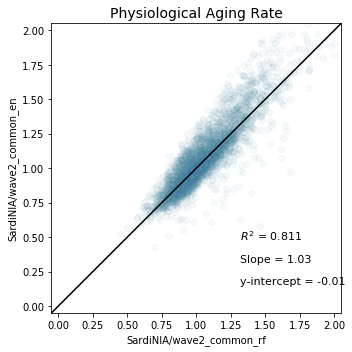

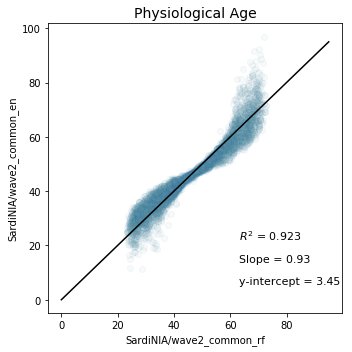

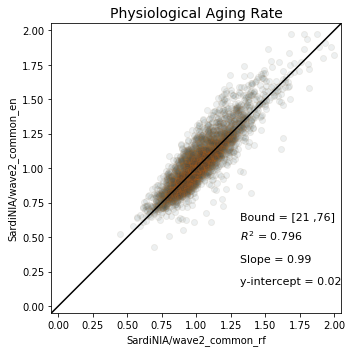

No handles with labels found to put in legend.


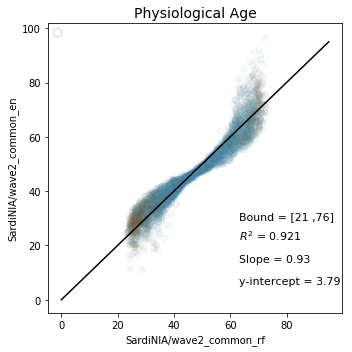

In [34]:
plotResults('SardiNIA/wave2_common_en', 'ElNet_Sard_w2_10k_common', rescale='none')
plotResults('SardiNIA/wave2_common_en', 'ElNet_Sard_w2_10k_common_bound', bound=[21,76], rescale='none')
plotResults('SardiNIA/wave2_common_rf', 'RFC_Sard_w2_10k_common', rescale='none')
plotResults('SardiNIA/wave2_common_rf', 'RFC_Sard_w2_10k_common_bound', bound=[21,76], rescale='none')
plotComparison('SardiNIA/wave2_common_rf', 'SardiNIA/wave2_common_en', 'W2_rfc_ElNet_10k_common', rescale='none')
plotComparison('SardiNIA/wave2_common_rf', 'SardiNIA/wave2_common_en', 'W2_rfc_ElNet_10k_common', bound=[21,76], rescale='none')

### 65 Common Clinical (W3)

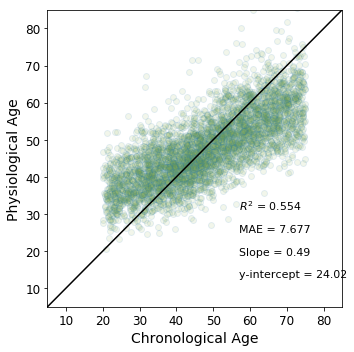

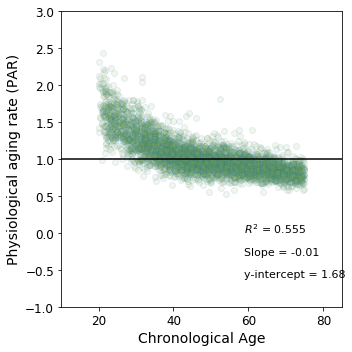

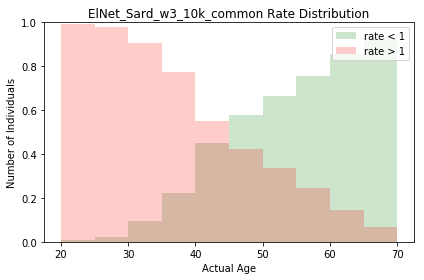

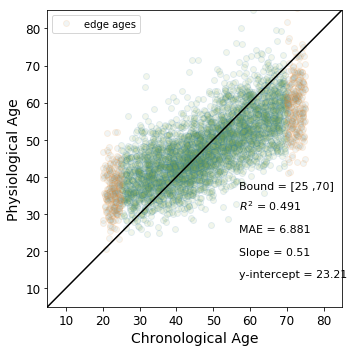

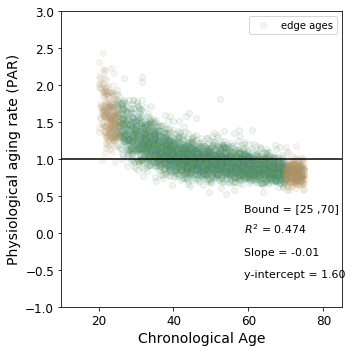

...

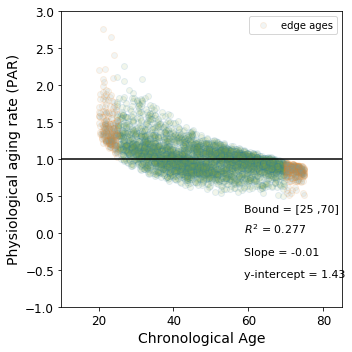

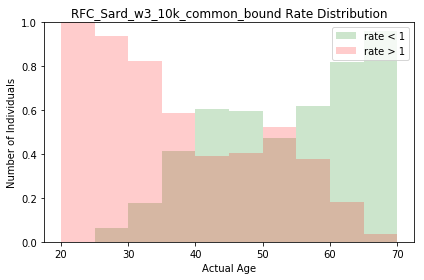

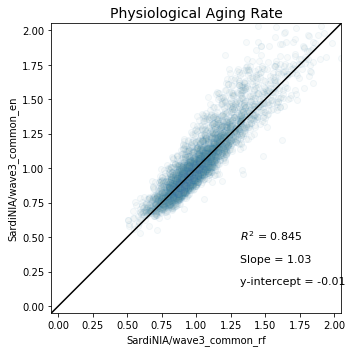

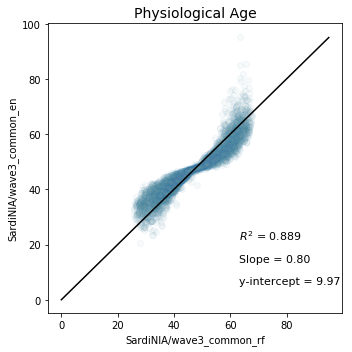

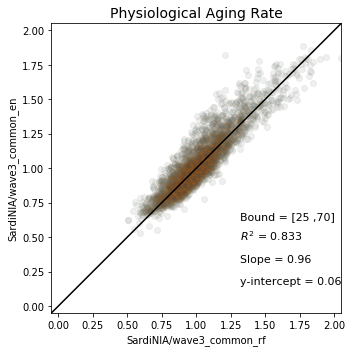

No handles with labels found to put in legend.


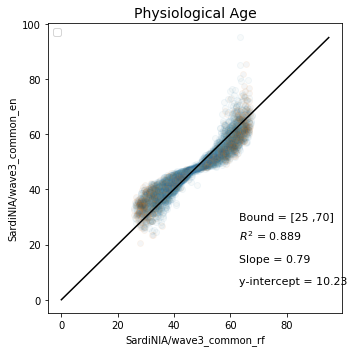

In [35]:
plotResults('SardiNIA/wave3_common_en', 'ElNet_Sard_w3_10k_common', rescale='none')
plotResults('SardiNIA/wave3_common_en', 'ElNet_Sard_w3_10k_common_bound', bound=[25,70], rescale='none')
plotResults('SardiNIA/wave3_common_rf', 'RFC_Sard_w3_10k_common', rescale='none')
plotResults('SardiNIA/wave3_common_rf', 'RFC_Sard_w3_10k_common_bound', bound=[25,70], rescale='none')
plotComparison('SardiNIA/wave3_common_rf', 'SardiNIA/wave3_common_en', 'W3_rfc_ElNet_10k_common', rescale='none')
plotComparison('SardiNIA/wave3_common_rf', 'SardiNIA/wave3_common_en', 'W3_rfc_ElNet_10k_common_bound', bound=[25,70], rescale='none')

### 65 Common Clinical (W4)

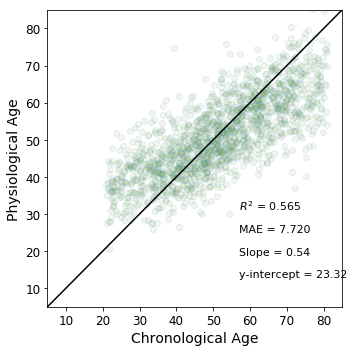

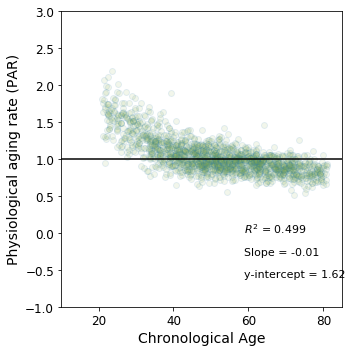

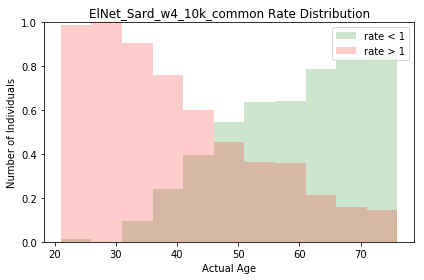

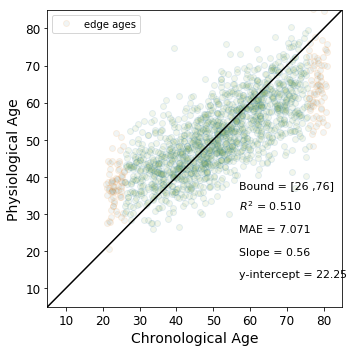

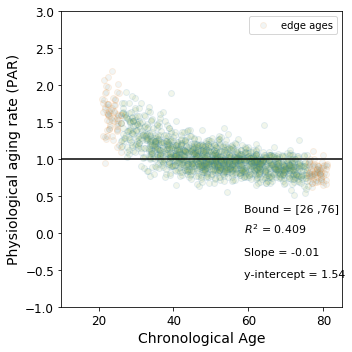

...

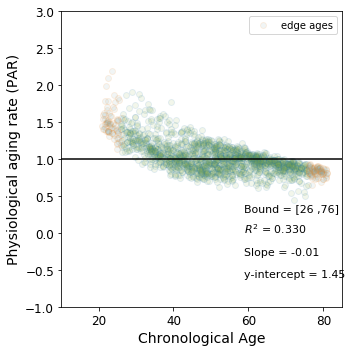

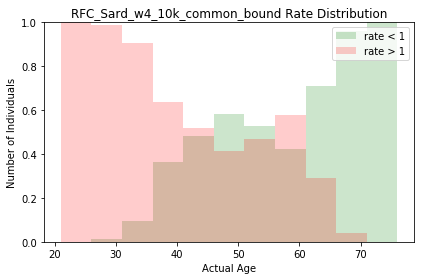

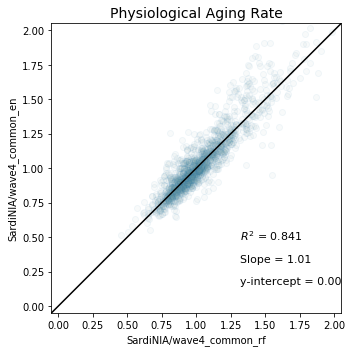

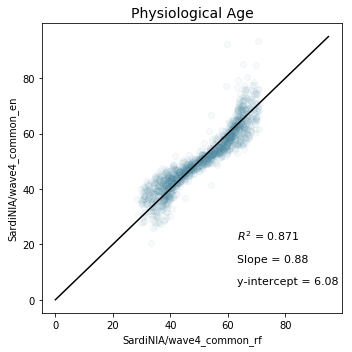

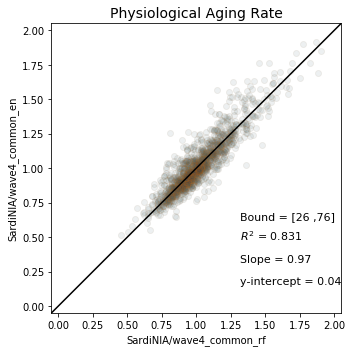

No handles with labels found to put in legend.


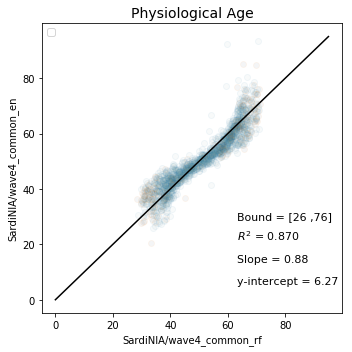

In [36]:
plotResults('SardiNIA/wave4_common_en', 'ElNet_Sard_w4_10k_common', rescale='none')
plotResults('SardiNIA/wave4_common_en', 'ElNet_Sard_w4_10k_common_bound', bound=[26,76], rescale='none')
plotResults('SardiNIA/wave4_common_rf', 'RFC_Sard_w4_10k_common', rescale='none')
plotResults('SardiNIA/wave4_common_rf', 'RFC_Sard_w4_10k_common_bound', bound=[26,76], rescale='none')
plotComparison('SardiNIA/wave4_common_rf', 'SardiNIA/wave4_common_en', 'W4_rfc_ElNet_10k_common', rescale='none')
plotComparison('SardiNIA/wave4_common_rf', 'SardiNIA/wave4_common_en', 'W4_rfc_ElNet_10k_common_bound', bound=[26,76], rescale='none')

In [17]:
'''
OLD-DEPRECATED SAVING CODE

SEE BOTTOM OF NOTEBOOK FOR PAR SAVING CODE FOR GWAS
'''

# Saving aging rates for GWAS
bound = [(17+21+25+26)/4, (72+76+70+76)/4]
print (bound)
saveRates('./Results/SardiNIA/normal_rf/', 'RFC_Sard_rates', rescale='linear')
saveRates('./Results/SardiNIA/normal_en/', 'Elnet_Sard_rates', rescale='linear')
saveRates('./Results/SardiNIA/normal_rf/', 'RFC_Sard_rates_bound', bound=bound, rescale='linear')
saveRates('./Results/SardiNIA/normal_en/', 'Elnet_Sard_rates_bound', bound=bound, rescale='linear')

saveRates('./Results/SardiNIA/common_rf/', 'RFC_commSard_rates', rescale='linear')
saveRates('./Results/SardiNIA/common_en/', 'Elnet_commSard_rates', rescale='linear')
saveRates('./Results/SardiNIA/common_rf/', 'RFC_commSard_rates_bound', bound=bound, rescale='linear')
saveRates('./Results/SardiNIA/common_en/', 'Elnet_commSard_rates_bound', bound=bound, rescale='linear')

# Getting just aging rates
a1 = np.genfromtxt('./Results/Rates/RFC_Sard_rates.tsv', delimiter='\t')
a2 = np.genfromtxt('./Results/Rates/Elnet_Sard_rates.tsv', delimiter='\t')
b1 = np.genfromtxt('./Results/Rates/RFC_Sard_rates_bound.tsv', delimiter='\t')
b2 = np.genfromtxt('./Results/Rates/Elnet_Sard_rates_bound.tsv', delimiter='\t')

if a1[234,0] == a2[234,0]:
    print ('files ok')
    
if b1[234,0] == b2[234,0]:
    print ('bound files ok')

a = np.column_stack((a1[:,0], a1[:,3], a2[:,3], a1[:,4], a2[:,4]))
b = np.column_stack((b1[:,0], b1[:,3], b2[:,3], b1[:,4], b2[:,4]))

np.savetxt('./Results/Rates/RFC_Elnet_Sard1234_rates.tsv', a, fmt='%.3f', delimiter='\t')
np.savetxt('./Results/Rates/RFC_Elnet_Sard1234_rates_bound.tsv', b, fmt='%.3f', delimiter='\t')

print (a.shape)
print (b.shape)

a1 = np.genfromtxt('./Results/Rates/RFC_commSard_rates.tsv', delimiter='\t')
a2 = np.genfromtxt('./Results/Rates/Elnet_commSard_rates.tsv', delimiter='\t')
b1 = np.genfromtxt('./Results/Rates/RFC_commSard_rates_bound.tsv', delimiter='\t')
b2 = np.genfromtxt('./Results/Rates/Elnet_commSard_rates_bound.tsv', delimiter='\t')

if a1[234,0] == a2[234,0]:
    print ('files ok')
    
if b1[234,0] == b2[234,0]:
    print ('bound files ok')

a = np.column_stack((a1[:,0], a1[:,3], a2[:,3], a1[:,4], a2[:,4]))
b = np.column_stack((b1[:,0], b1[:,3], b2[:,3], b1[:,4], b2[:,4]))

print (a.shape)
print (b.shape)

np.savetxt('./Results/Rates/RFC_Elnet_commSard1234_rates.tsv', a, fmt='%.3f', delimiter='\t')
np.savetxt('./Results/Rates/RFC_Elnet_commSard1234_rates_bound.tsv', b, fmt='%.3f', delimiter='\t')

[22.25, 73.5]
files ok
bound files ok
(5684, 5)
(4968, 5)
files ok
bound files ok
(6439, 5)
(5678, 5)


# Results for InCHIANTI study

### Wave 0 (baseline)

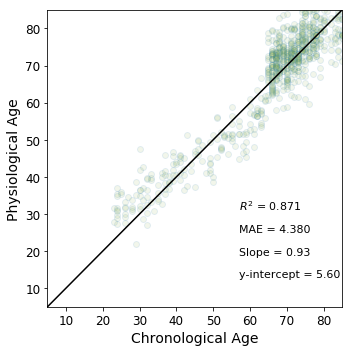

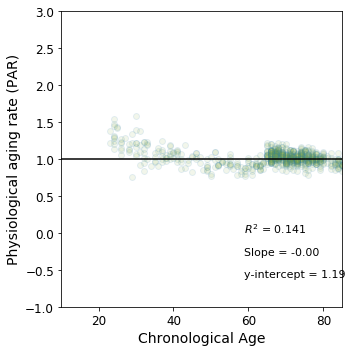

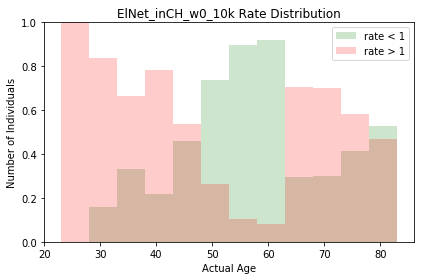

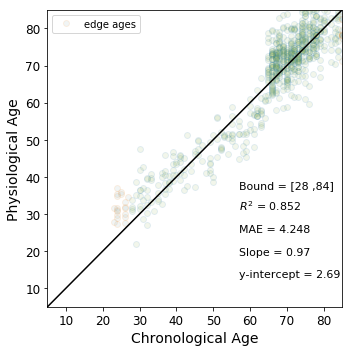

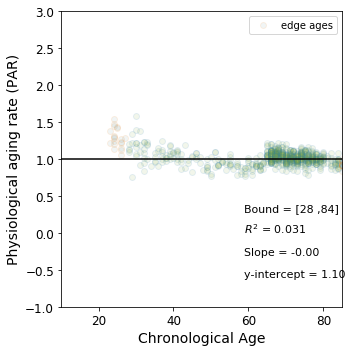

...

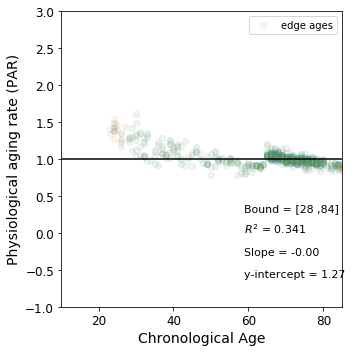

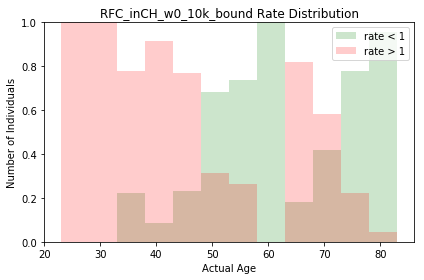

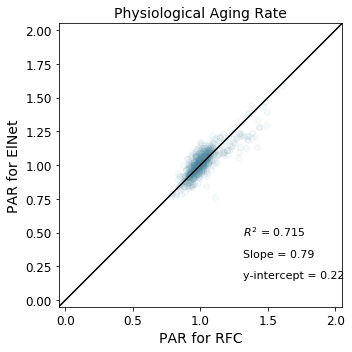

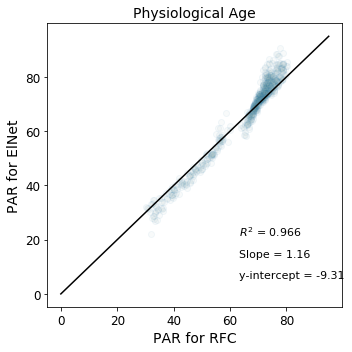

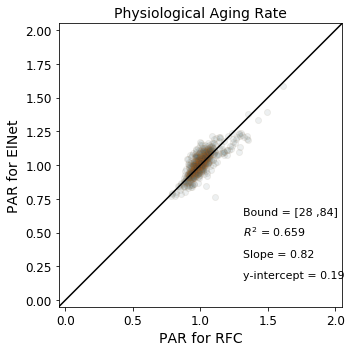

No handles with labels found to put in legend.


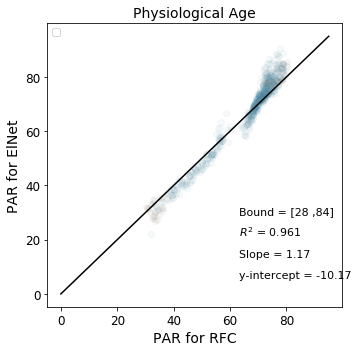

In [37]:
plotResults('inCHIANTI/wave0_inchianti_en', 'ElNet_inCH_w0_10k', rescale='none')
plotResults('inCHIANTI/wave0_inchianti_en', 'ElNet_inCH_w0_10k_bound', bound=[28,84], rescale='none')
plotResults('inCHIANTI/wave0_inchianti_rf', 'RFC_inCH_w0_10k', rescale='none')
plotResults('inCHIANTI/wave0_inchianti_rf', 'RFC_inCH_w0_10k_bound', bound=[28,84], rescale='none')
plotComparison('inCHIANTI/wave0_inchianti_rf', 'inCHIANTI/wave0_inchianti_en', 'inCH_W0_rfc_en_10k', x_label='PAR for RFC',y_label='PAR for ElNet', rescale='none')
plotComparison('inCHIANTI/wave0_inchianti_rf', 'inCHIANTI/wave0_inchianti_en', 'inCH_W0_rfc_en_10k_bound', x_label='PAR for RFC',y_label='PAR for ElNet',bound=[28,84], rescale='none')

### Wave 1

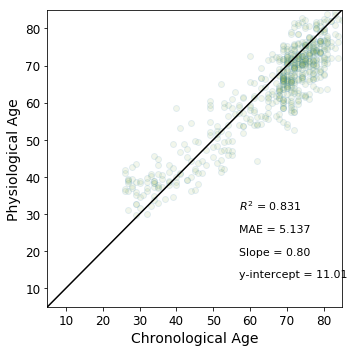

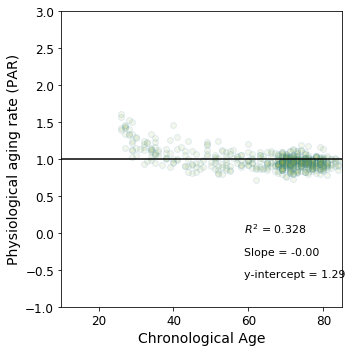

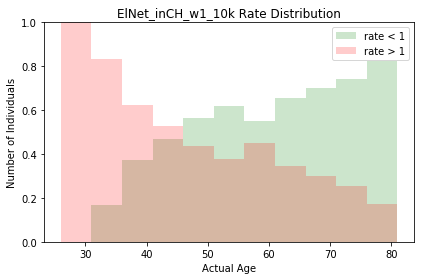

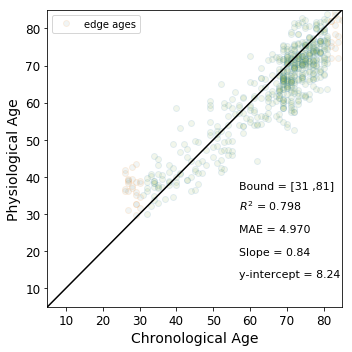

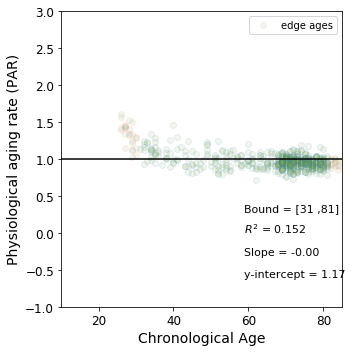

...

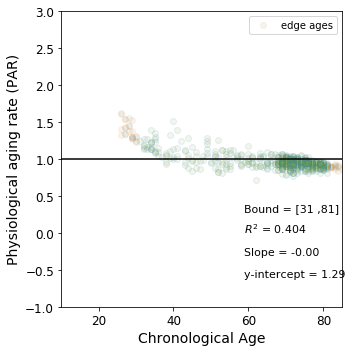

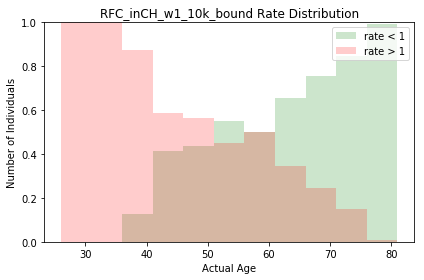

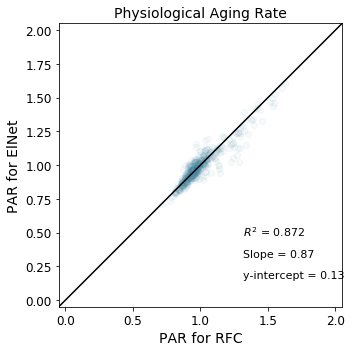

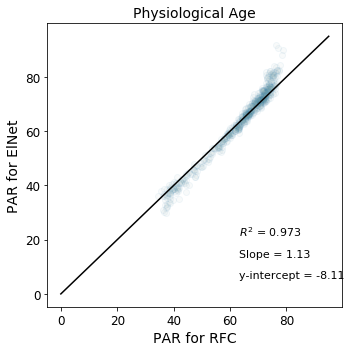

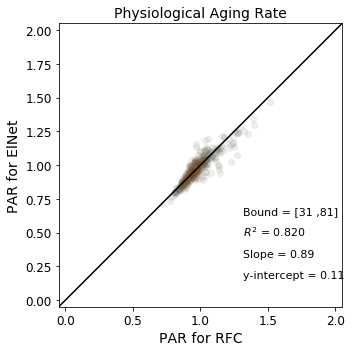

No handles with labels found to put in legend.


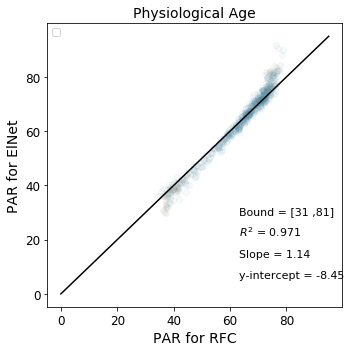

In [38]:
plotResults('inCHIANTI/wave1_inchianti_en', 'ElNet_inCH_w1_10k', rescale='none')
plotResults('inCHIANTI/wave1_inchianti_en', 'ElNet_inCH_w1_10k_bound', bound=[31,81], rescale='none')
plotResults('inCHIANTI/wave1_inchianti_rf', 'RFC_inCH_w1_10k', rescale='none')
plotResults('inCHIANTI/wave1_inchianti_rf', 'RFC_inCH_w1_10k_bound', bound=[31,81], rescale='none')
plotComparison('inCHIANTI/wave1_inchianti_rf', 'inCHIANTI/wave1_inchianti_en', 'inCH_W1_rfc_en_10k', x_label='PAR for RFC',y_label='PAR for ElNet', rescale='none')
plotComparison('inCHIANTI/wave1_inchianti_rf', 'inCHIANTI/wave1_inchianti_en', 'inCH_W1_rfc_en_10k_bound', x_label='PAR for RFC',y_label='PAR for ElNet',bound=[31,81], rescale='none')

### Wave 2

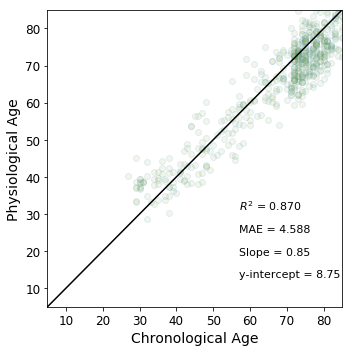

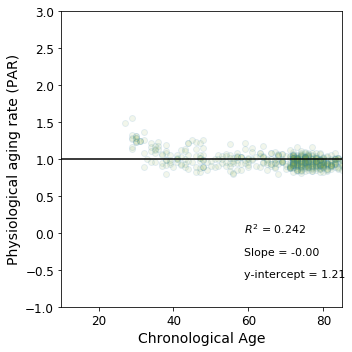

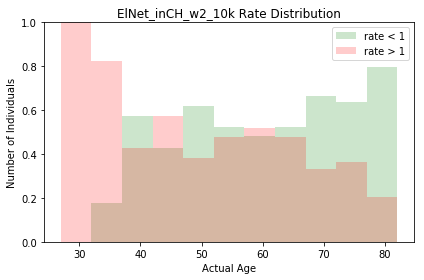

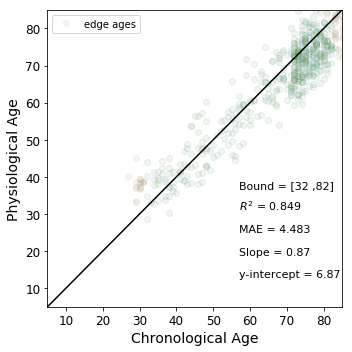

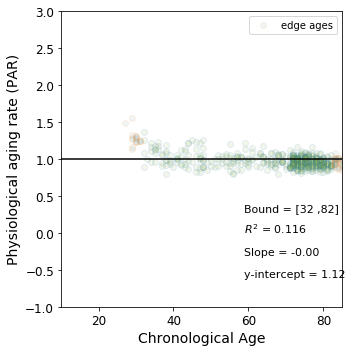

...

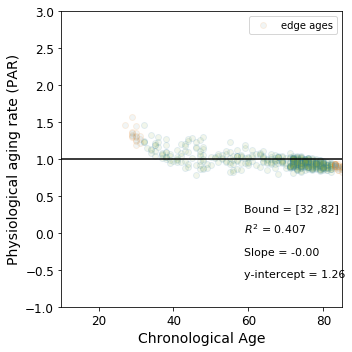

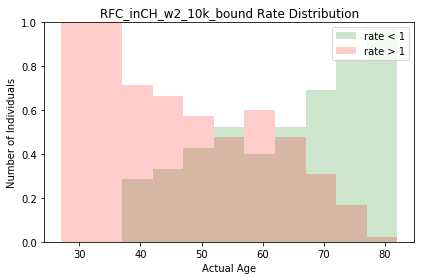

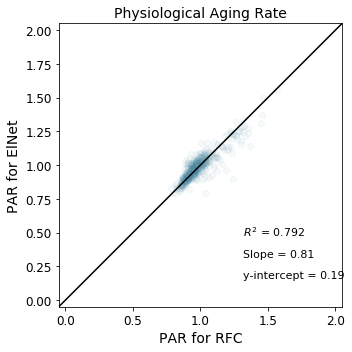

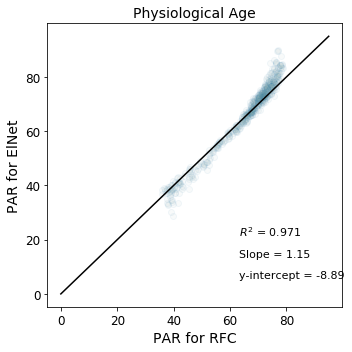

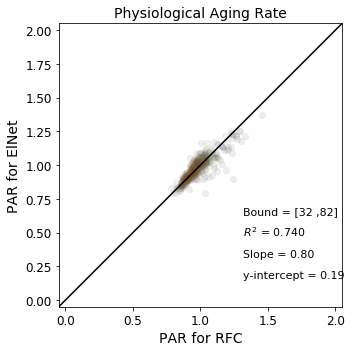

No handles with labels found to put in legend.


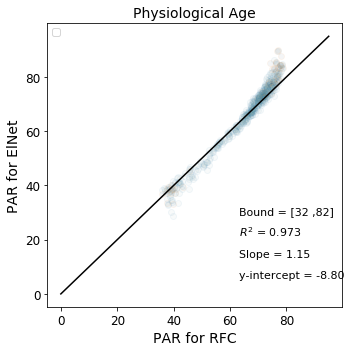

In [39]:
plotResults('inCHIANTI/wave2_inchianti_en', 'ElNet_inCH_w2_10k', rescale='none')
plotResults('inCHIANTI/wave2_inchianti_en', 'ElNet_inCH_w2_10k_bound', bound=[32,82], rescale='none')
plotResults('inCHIANTI/wave2_inchianti_rf', 'RFC_inCH_w2_10k', rescale='none')
plotResults('inCHIANTI/wave2_inchianti_rf', 'RFC_inCH_w2_10k_bound', bound=[32,82], rescale='none')
plotComparison('inCHIANTI/wave2_inchianti_rf', 'inCHIANTI/wave2_inchianti_en', 'inCH_W2_rfc_en_10k', x_label='PAR for RFC',y_label='PAR for ElNet', rescale='none')
plotComparison('inCHIANTI/wave2_inchianti_rf', 'inCHIANTI/wave2_inchianti_en', 'inCH_W2_rfc_en_10k_bound', x_label='PAR for RFC',y_label='PAR for ElNet',bound=[32,82], rescale='none')

### Wave 3

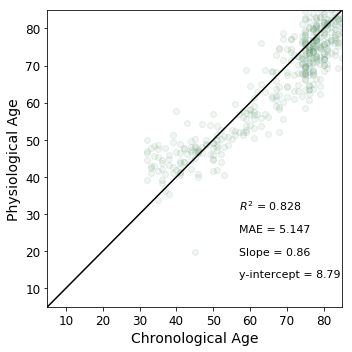

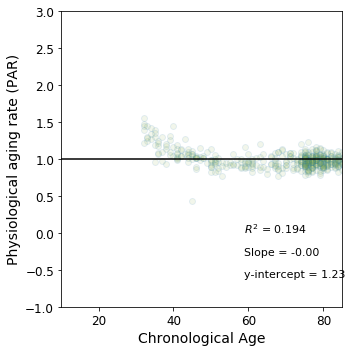

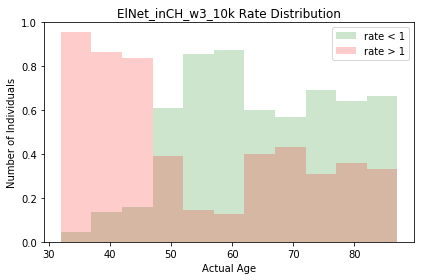

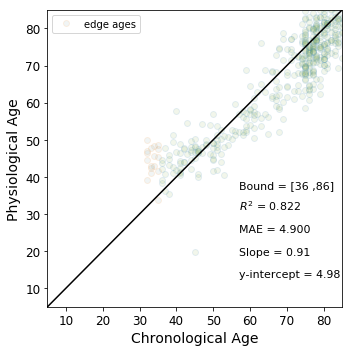

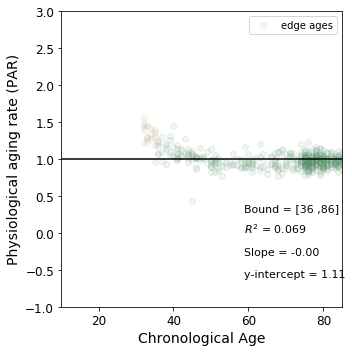

...

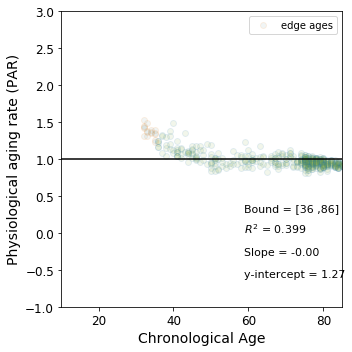

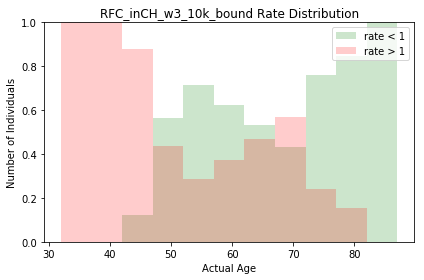

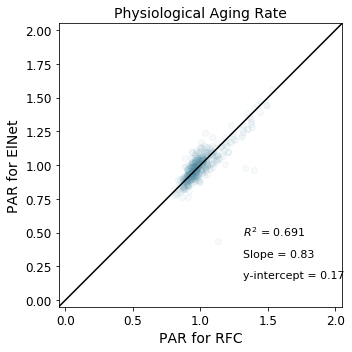

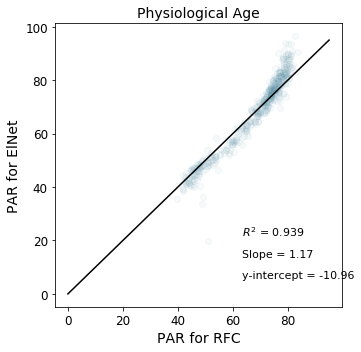

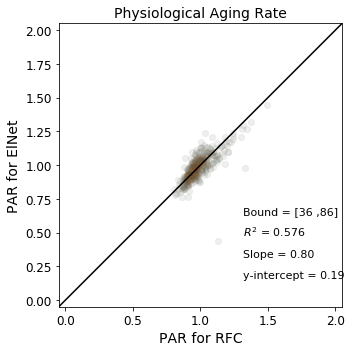

No handles with labels found to put in legend.


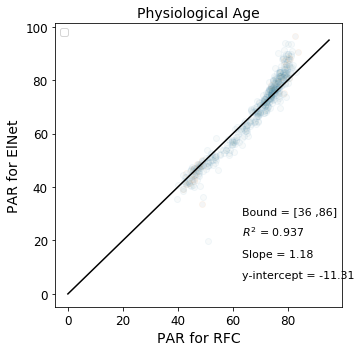

In [40]:
plotResults('inCHIANTI/wave3_inchianti_en', 'ElNet_inCH_w3_10k', rescale='none')
plotResults('inCHIANTI/wave3_inchianti_en', 'ElNet_inCH_w3_10k_bound', bound=[36,86], rescale='none')
plotResults('inCHIANTI/wave3_inchianti_rf', 'RFC_inCH_w3_10k', rescale='none')
plotResults('inCHIANTI/wave3_inchianti_rf', 'RFC_inCH_w3_10k_bound', bound=[36,86], rescale='none')
plotComparison('inCHIANTI/wave3_inchianti_rf', 'inCHIANTI/wave3_inchianti_en', 'inCH_W3_rfc_en_10k', x_label='PAR for RFC',y_label='PAR for ElNet', rescale='none')
plotComparison('inCHIANTI/wave3_inchianti_rf', 'inCHIANTI/wave3_inchianti_en', 'inCH_W3_rfc_en_10k_bound', x_label='PAR for RFC',y_label='PAR for ElNet',bound=[36,86], rescale='none')

#### Summary of $R^2$ values (RFC, ELN)
|Setup|X vs Y|R^2|
|---|---|--|
|Normal|All vs Common|(0.7984, 0.8358)|
|Rescaled|All vs Common|(0.6877,0.7343)|
|All|Normal vs Rescaled|(0.6331,0.6904)|
|Common|Normal vs Rescaled|(0.6724,0.6721)|
|All|Bound>Rescale vs Rescale>Bound|NA|
|Common|Bound>Rescale vs Rescale>Bound|NA|

Other comparison is Bound>Rescale vs Rescale>Bound, but Rescale>Bound doesn't make sense as there would be no need for bounding if the rescaling was already achieved to remove the edge effect. This is not one of the data types that we explored. 

## New saving function

The files are saved with columns:

[ID] [RFC PAR] [ElNet PAR] [RFC rescaled PAR] [ElNet rescaled PAR] [RFC PAA] [ElNet PAA] [RFC rescaled PAA] [ElNet rescaled PAA] 

In [20]:
# Saving aging rates for GWAS
bound = [(17+21+25+26)/4, (72+76+70+76)/4]
print (bound)
saveRatesNEW('./Results/SardiNIA/normal_rf/', 'RFC_Sard_rates', rescale='linear')
saveRatesNEW('./Results/SardiNIA/normal_en/', 'Elnet_Sard_rates', rescale='linear')
saveRatesNEW('./Results/SardiNIA/normal_rf/', 'RFC_Sard_rates_bound', bound=bound, rescale='linear')
saveRatesNEW('./Results/SardiNIA/normal_en/', 'Elnet_Sard_rates_bound', bound=bound, rescale='linear')

saveRatesNEW('./Results/SardiNIA/common_rf/', 'RFC_commSard_rates', rescale='linear')
saveRatesNEW('./Results/SardiNIA/common_en/', 'Elnet_commSard_rates', rescale='linear')
saveRatesNEW('./Results/SardiNIA/common_rf/', 'RFC_commSard_rates_bound', bound=bound, rescale='linear')
saveRatesNEW('./Results/SardiNIA/common_en/', 'Elnet_commSard_rates_bound', bound=bound, rescale='linear')

# Getting just aging rates
a1 = np.genfromtxt('./Results/Rates/RFC_Sard_rates.tsv', delimiter='\t')
a2 = np.genfromtxt('./Results/Rates/Elnet_Sard_rates.tsv', delimiter='\t')
b1 = np.genfromtxt('./Results/Rates/RFC_Sard_rates_bound.tsv', delimiter='\t')
b2 = np.genfromtxt('./Results/Rates/Elnet_Sard_rates_bound.tsv', delimiter='\t')

if a1[234,0] == a2[234,0]:
    print ('files ok')
    
if b1[234,0] == b2[234,0]:
    print ('bound files ok')

a = np.column_stack((a1[:,0], a1[:,3], a2[:,3], a1[:,4], a2[:,4], a1[:,5], a2[:,5], a1[:,6], a2[:,6]))
b = np.column_stack((b1[:,0], b1[:,3], b2[:,3], b1[:,4], b2[:,4], b1[:,5], b2[:,5], b1[:,6], b2[:,6]))

np.savetxt('./Results/Rates/RFC_Elnet_Sard1234_rates.tsv', a, fmt='%.3f', delimiter='\t')
np.savetxt('./Results/Rates/RFC_Elnet_Sard1234_rates_bound.tsv', b, fmt='%.3f', delimiter='\t')

print (a.shape)
print (b.shape)

a1 = np.genfromtxt('./Results/Rates/RFC_commSard_rates.tsv', delimiter='\t')
a2 = np.genfromtxt('./Results/Rates/Elnet_commSard_rates.tsv', delimiter='\t')
b1 = np.genfromtxt('./Results/Rates/RFC_commSard_rates_bound.tsv', delimiter='\t')
b2 = np.genfromtxt('./Results/Rates/Elnet_commSard_rates_bound.tsv', delimiter='\t')

if a1[234,0] == a2[234,0]:
    print ('files ok')
    
if b1[234,0] == b2[234,0]:
    print ('bound files ok')

a = np.column_stack((a1[:,0], a1[:,3], a2[:,3], a1[:,4], a2[:,4], a1[:,5], a2[:,5], a1[:,6], a2[:,6]))
b = np.column_stack((b1[:,0], b1[:,3], b2[:,3], b1[:,4], b2[:,4], b1[:,5], b2[:,5], b1[:,6], b2[:,6]))

print (a.shape)
print (b.shape)

np.savetxt('./Results/Rates/RFC_Elnet_commSard1234_rates.tsv', a, fmt='%.3f', delimiter='\t')
np.savetxt('./Results/Rates/RFC_Elnet_commSard1234_rates_bound.tsv', b, fmt='%.3f', delimiter='\t')

[22.25, 73.5]
files ok
bound files ok
(5684, 9)
(5146, 9)
files ok
bound files ok
(6439, 9)
(5947, 9)


In [22]:
# Saving aging rates for GWAS
bound = [(17+21+25+26)/4, (72+76+70+76)/4]
print (bound)
saveRatesNEW('./Results/inCHIANTI/normal_rf/', 'RFC_inCH_rates', rescale='linear')
saveRatesNEW('./Results/inCHIANTI/normal_en/', 'Elnet_inCH_rates', rescale='linear')
saveRatesNEW('./Results/inCHIANTI/normal_rf/', 'RFC_inCH_rates_bound', bound=bound, rescale='linear')
saveRatesNEW('./Results/inCHIANTI/normal_en/', 'Elnet_inCH_rates_bound', bound=bound, rescale='linear')

# Getting just aging rates
a1 = np.genfromtxt('./Results/Rates/RFC_inCH_rates.tsv', delimiter='\t')
a2 = np.genfromtxt('./Results/Rates/Elnet_inCH_rates.tsv', delimiter='\t')
b1 = np.genfromtxt('./Results/Rates/RFC_inCH_rates_bound.tsv', delimiter='\t')
b2 = np.genfromtxt('./Results/Rates/Elnet_inCH_rates_bound.tsv', delimiter='\t')

if a1[234,0] == a2[234,0]:
    print ('files ok')
    
if b1[234,0] == b2[234,0]:
    print ('bound files ok')

a = np.column_stack((a1[:,0], a1[:,3], a2[:,3], a1[:,4], a2[:,4], a1[:,5], a2[:,5], a1[:,6], a2[:,6]))
b = np.column_stack((b1[:,0], b1[:,3], b2[:,3], b1[:,4], b2[:,4], b1[:,5], b2[:,5], b1[:,6], b2[:,6]))

print (a.shape)
print (b.shape)

np.savetxt('./Results/Rates/RFC_Elnet_inCH0123_rates.tsv', a, fmt='%.3f', delimiter='\t')
np.savetxt('./Results/Rates/RFC_Elnet_inCH0123_rates_bound.tsv', b, fmt='%.3f', delimiter='\t')

[22.25, 73.5]
files ok
bound files ok
(1007, 9)
(656, 9)


## Distribution of PARs (SardiNIA vs InCHIANTI)

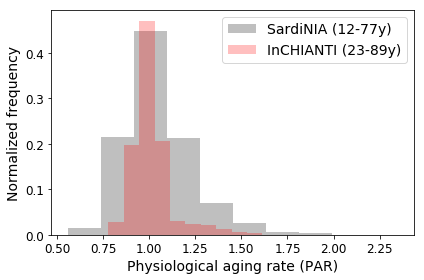

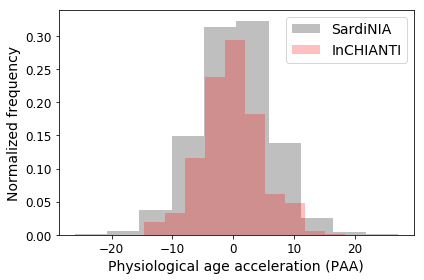

In [2]:
sard_w1_data = np.genfromtxt('./Results/SardiNIA/wave1_normal_rf.tsv', delimiter='\t')
inCH_w1_data = np.genfromtxt('./Results/inCHIANTI/wave0_inchianti_rf.tsv',delimiter='\t')

sard_w1_chrons = sard_w1_data[:,1]
sard_w1_preds = sard_w1_data[:,2]
inCH_w1_chrons = inCH_w1_data[1:,1]
inCH_w1_preds = inCH_w1_data[1:,2]

sard_PARs = sard_w1_preds/sard_w1_chrons
sard_PAAs = sard_w1_preds-sard_w1_chrons
inCH_PARs = inCH_w1_preds/inCH_w1_chrons
inCH_PAAs = inCH_w1_preds-inCH_w1_chrons

pl.figure()
pl.tick_params(axis='both', which='major', labelsize=12)
pl.tick_params(axis='both', which='minor', labelsize=12)
pl.hist(sard_PARs, label='SardiNIA (12-77y)', color='k', weights=np.ones(len(sard_PARs)) / len(sard_PARs), alpha=0.25)
pl.hist(inCH_PARs, label='InCHIANTI (23-89y)', color='r', weights=np.ones(len(inCH_PARs)) / len(inCH_PARs), alpha=0.25)
pl.ylabel('Normalized frequency', fontsize=14)
pl.xlabel('Physiological aging rate (PAR)', fontsize=14)
pl.legend(fontsize=14)
pl.tight_layout()
pl.savefig('Figures/par_dists/PAR.png', dpi=800)
pl.show()

pl.figure()
pl.tick_params(axis='both', which='major', labelsize=12)
pl.tick_params(axis='both', which='minor', labelsize=12)
pl.hist(sard_PAAs, label='SardiNIA', color='k',weights=np.ones(len(sard_PAAs)) / len(sard_PAAs), alpha=0.25)
pl.hist(inCH_PAAs, label='InCHIANTI', color='r', weights=np.ones(len(inCH_PAAs)) / len(inCH_PAAs), alpha=0.25)
pl.ylabel('Normalized frequency', fontsize=14)
pl.xlabel('Physiological age acceleration (PAA)', fontsize=14)
pl.legend(fontsize=14)
pl.tight_layout()
pl.savefig('Figures/par_dists/PAA.png', dpi=800)
pl.show()

Binned ages plot

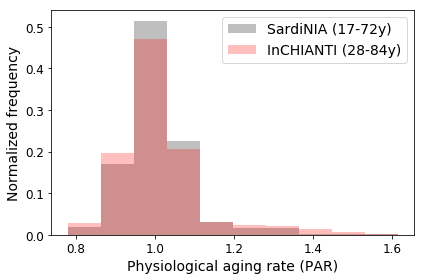

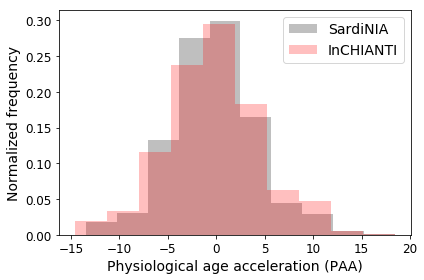

In [3]:
# 17-72 for Sard
# 28-84 for InCH

sard_w1_data = np.genfromtxt('./Results/SardiNIA/wave1_normal_rf.tsv', delimiter='\t')
inCH_w1_data = np.genfromtxt('./Results/inCHIANTI/wave0_inchianti_rf.tsv',delimiter='\t')

sard_w1_chrons = np.array([c for c in sard_w1_data[:,1] if (c>17 and c<72)])
sard_w1_preds = np.array([sard_w1_data[:,2][i] for i, c in enumerate(sard_w1_data[:,1]) if (c>17 and c<72)])
sard_w1_chrons = np.array([c for c in inCH_w1_data[1:,1] if (c>28 and c<84)])
sard_w1_preds = np.array([inCH_w1_data[1:,2][i] for i, c in enumerate(inCH_w1_data[1:,1]) if (c>28 and c<84)])

sard_PARs = sard_w1_preds/sard_w1_chrons
sard_PAAs = sard_w1_preds-sard_w1_chrons
inCH_PARs = inCH_w1_preds/inCH_w1_chrons
inCH_PAAs = inCH_w1_preds-inCH_w1_chrons

pl.figure()
pl.tick_params(axis='both', which='major', labelsize=12)
pl.tick_params(axis='both', which='minor', labelsize=12)
pl.hist(sard_PARs, label='SardiNIA (17-72y)', color='k', weights=np.ones(len(sard_PARs)) / len(sard_PARs), alpha=0.25)
pl.hist(inCH_PARs, label='InCHIANTI (28-84y)', color='r', weights=np.ones(len(inCH_PARs)) / len(inCH_PARs), alpha=0.25)
pl.ylabel('Normalized frequency', fontsize=14)
pl.xlabel('Physiological aging rate (PAR)', fontsize=14)
pl.legend(fontsize=14)
pl.tight_layout()
pl.savefig('Figures/par_dists/PAR_bound.png', dpi=800)
pl.show()

pl.figure()
pl.tick_params(axis='both', which='major', labelsize=12)
pl.tick_params(axis='both', which='minor', labelsize=12)
pl.hist(sard_PAAs, label='SardiNIA', color='k',weights=np.ones(len(sard_PAAs)) / len(sard_PAAs), alpha=0.25)
pl.hist(inCH_PAAs, label='InCHIANTI', color='r', weights=np.ones(len(inCH_PAAs)) / len(inCH_PAAs), alpha=0.25)
pl.ylabel('Normalized frequency', fontsize=14)
pl.xlabel('Physiological age acceleration (PAA)', fontsize=14)
pl.legend(fontsize=14)
pl.tight_layout()
pl.savefig('Figures/par_dists/PAA_bound.png', dpi=800)
pl.show()